# **Predicting the Impact of Asteroids on Earth**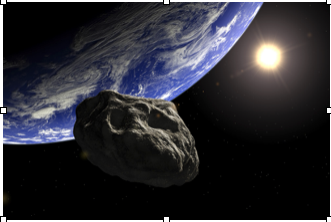

---



# **1. Business Case and Value and Introduction**

An Asteroid is a small rocky body that orbits the Sun and are usually smaller than a planet, but  larger than the pebble-size objects called meteoroids. Most asteroids in our solar system are found in the region between Mars and Jupiter(called asteroid belt). But they can also hang out in other locations around the solar system. For example, some asteroids orbit the Sun in a path that takes them near Earth.


Near-Earth Asteroids (NEA’s) are asteroids that have been nudged by the gravitational attraction of nearby planets into orbits that allow them to enter the Earth’s neighborhood and have perihelion distance less than 1.3 au. Potentially Hazardous Asteroids (PHAs) are asteroids with potential to make threatening close approaches to the Earth.  
Though the probability of an asteroid hitting the earth is very low, the impact of collision has catastrophic effects (A huge asteroid wiped out the dinosaurs around 66 million years ago).
***The Objective of this project is to find asteroids which are Earth-crossing NEA’s and are PHA’s and predict the impact of collision of such asteroids. ***


The Orbital parameters are obtained from JPL website maintained by NASA
https://ssd.jpl.nasa.gov/sbdb_query.cgi#x
The Impact parameters are obtained from Sentry website maintained by NASA
https://cneos.jpl.nasa.gov/sentry/

## **2. Data Preprocessing**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
import matplotlib as mpl

### 2.1NASA JPL Data Loading, Cleaning and Saving Cleaned Data

Original Data Link URL : '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/NASA_JPL.csv'

Cleaned Data Link: '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/nasa_jpl_cleaned.csv'

Data Narrative :

We did some feature engineering to remove the missing values for name, ma, ad, moid , neo and pha.

We save the cleaned data for future use in Exploratory Analysis

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
import matplotlib as mpl

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/NASA_JPL.csv'

df_orbit = pd.read_csv(path, delimiter=',')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
df_orbit.round()

,spkid,full_name,pdes,name,e,a,q,i,om,w,ma,ad,n,moid,neo,pha
0,2000001,1 Ceres (A801 AA),1,Ceres,0.0,3.0,3.0,11.0,80.0,74.0,206.0,3.0,0.0,2.0,N,N
1,2000002,2 Pallas (A802 FA),2,Pallas,0.0,3.0,2.0,35.0,173.0,310.0,188.0,3.0,0.0,1.0,N,N
2,2000003,3 Juno (A804 RA),3,Juno,0.0,3.0,2.0,13.0,170.0,248.0,171.0,3.0,0.0,1.0,N,N
3,2000004,4 Vesta (A807 FA),4,Vesta,0.0,2.0,2.0,7.0,104.0,151.0,259.0,3.0,0.0,1.0,N,N
4,2000005,5 Astraea (A845 XA),5,Astraea,0.0,3.0,2.0,5.0,142.0,359.0,66.0,3.0,0.0,1.0,N,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1070325,54133309,(2021 FN3),2021 FN3,NaN,1.0,3.0,1.0,7.0,83.0,111.0,354.0,5.0,0.0,NaN,N,NaN
1070326,54133408,(2021 FO3),2021 FO3,NaN,0.0,2.0,1.0,7.0,141.0,118.0,332.0,3.0,0.0,NaN,N,NaN
1070327,3246764,(4847 P-L),4847 P-L,NaN,0.0,3.0,2.0,8.0,14.0,355.0,358.0,3.0,0.0,1.0,N,N
1070328,3246834,(6331 P-L),6331 P-L,NaN,0.0,2.0,2.0,8.0,355.0,5.0,315.0,3.0,0.0,1.0,N,N


Features: spkid: Database ID full_name: Official name pdes: Primary designation name: other names of asteroids e: Eccentricity - represents how flat the orbit looks. For example an orbit with e=0 is circular, e=1 is parabolic, and e between 0 and 1 is elliptic. a: Semi-Major-Axis - Half of the major axis of the orbit (elliptical in shape) is called the semi-major axis, and measured in Astronomical Unit (au). 1 au = distance between the sun and earth. q: perihelion distance(au) - The distance between the orbiting body and the sun at its closest approach. i: Inclination with respect to x-y ecliptic plane(deg) om: Longitude of the ascending node w: argument of perihelion ma: Mean Anamoly - the product of an orbiting body's mean motion and time past perihelion passage. ad: Aphelion Distance (au) The distance between the orbiting body and the sun at its farthest approach. n: Mean Motion moid: Earth Minimum Orbit Intersection Distance neo: Near Earth Object Flag pha: Physically Hazardous Asteroid flag

In [ ]:
#@title Function to find missing values
def missing_percentage(df):
    total = df.isnull().sum().sort_values(ascending = False)
    percent = round(df.isnull().sum().sort_values(ascending = False)/len(df)*100,2)
    return pd.concat([total, percent], axis=1, keys=['Total','Percent'])

def percent_value_counts(df, feature):
    percent = pd.DataFrame(round(df.loc[:,feature].value_counts(dropna=False, normalize=True)*100,2))
    total = pd.DataFrame(df.loc[:,feature].value_counts(dropna=False))
    total.columns = ["Total"]
    percent.columns = ['Percent']
    return pd.concat([total, percent], axis = 1)

In [ ]:
missing_percentage(df_orbit)

,Total,Percent
name,1048150,97.93
pha,1572,0.15
moid,1571,0.15
neo,3,0.00
ad,3,0.00
ma,1,0.00
n,0,0.00
w,0,0.00
om,0,0.00
i,0,0.00


In [ ]:
df_orbit.shape

(1070330, 16)

In [ ]:
# Clean Rows
df_orbit = df_orbit.drop(columns=['name'], axis=1)
df_orbit = df_orbit.dropna(subset=['ma','ad','moid','neo','pha'] )

In [ ]:
missing_percentage(df_orbit)

,Total,Percent
pha,0,0.0
neo,0,0.0
moid,0,0.0
n,0,0.0
ad,0,0.0
ma,0,0.0
w,0,0.0
om,0,0.0
i,0,0.0
q,0,0.0


In [ ]:
df_orbit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1068754 entries, 0 to 1070329
Data columns (total 15 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   spkid      1068754 non-null  int64  
 1   full_name  1068754 non-null  object 
 2   pdes       1068754 non-null  object 
 3   e          1068754 non-null  float64
 4   a          1068754 non-null  float64
 5   q          1068754 non-null  float64
 6   i          1068754 non-null  float64
 7   om         1068754 non-null  float64
 8   w          1068754 non-null  float64
 9   ma         1068754 non-null  float64
 10  ad         1068754 non-null  float64
 11  n          1068754 non-null  float64
 12  moid       1068754 non-null  float64
 13  neo        1068754 non-null  object 
 14  pha        1068754 non-null  object 
dtypes: float64(10), int64(1), object(4)
memory usage: 130.5+ MB


In [ ]:
# Save cleaned data
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/nasa_jpl_cleaned.csv'

df_orbit.to_csv(path, index=False)

### 2.2CNEOS Sentry Data Loading, Cleaning and Saving Cleaned Data

Original Data Link URL : '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/cneos_sentry_summary_data.csv'

Cleaned Data Link : '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/cneos_sentry_cleaned.csv'


Data Narrative :

We removed the columns that have no sense  for analysis like columns with values that were all zeros Torino Scale (max.) and no column name Unnamed: 10. Also, we remove some missing values in column Vinfinity.

We save the cleaned data for future use in Exploratory Analysis

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/cneos_sentry_summary_data.csv'

df_impact = pd.read_csv(path, delimiter=',')

In [ ]:
df_impact

,Object Designation,Year Range,Potential Impacts,Impact Probability (cumulative),Vinfinity (km/s),H (mag),Estimated Diameter (km),Palermo Scale (cum.),Palermo Scale (max.),Torino Scale (max.),Unnamed: 10
0,29075 (1950 DA),2880-2880,1,1.200000e-04,14.10,17.6,1.300,-1.42,-1.42,NaN,a0029075
1,101955 Bennu (1999 RQ36),2175-2199,78,3.700000e-04,5.99,20.2,0.490,-1.69,-2.30,NaN,a0101955
2,(1979 XB),2056-2113,2,7.400000e-07,23.92,18.5,0.662,-2.79,-3.08,0.0,bJ79X00B
3,(2000 SG344),2069-2113,101,2.600000e-03,1.36,24.8,0.037,-2.84,-3.20,0.0,bK00SY4G
4,(2009 JF1),2022-2022,1,2.600000e-04,23.92,27.1,0.013,-2.88,-2.88,0.0,bK09J01F
...,...,...,...,...,...,...,...,...,...,...,...
1144,(2018 RW),2110-2110,1,5.400000e-09,5.74,30.3,0.003,-11.24,-11.24,0.0,bK18R00W
1145,(2019 UT5),2080-2080,1,2.400000e-10,14.16,28.4,0.007,-11.27,-11.27,0.0,bK19U05T
1146,(2017 YK14),2075-2075,1,1.700000e-10,3.25,28.2,0.008,-11.58,-11.58,0.0,bK17Y14K
1147,(2019 BZ3),2092-2092,1,1.500000e-10,10.55,28.7,0.006,-11.80,-11.80,0.0,bK19B03Z


**Features**:
Object Designation: Temporary designation or permanent number for this object.
Year Range: Time span over which impacts have been detected. Typically, searches are conducted 100 years into the future.
Potential Impacts: Number of dynamically distinct potential impacts that have been detected by Sentry.
Impact Probability (cumulative):Sum of the impact probabilities from all detected potential impacts.
Vinfinity (km/s): Velocity of the asteroid relative to the Earth, assuming a massless Earth.
H (mag): Absolute Magnitude, a measure of intrinsic brightness. It is the apparent magnitude of the object when it is 1 au from both the sun and the observer, and at full phase for the observer.
Estimated Diameter (km): Estimated diameter of the asteroid. This is an estimate based on the absolute magnitude, usually assuming a uniform spherical body.
Palermo Scale (cum.): Cumulative hazard rating according to the Palermo technical impact hazard scale, based on the tabulated impact date, impact probability and impact energy.
Palermo Scale (max.): Maximum hazard rating according to the Palermo technical impact hazard scale, based on the tabulated impact date, impact probability and impact energy.
Torino Scale (max.): Maximum detected hazard rating according to the Torino impact hazard scale, based on the tabulated impact probability and impact energy.

In [ ]:
missing_percentage(df_impact)

,Total,Percent
Torino Scale (max.),2,0.17
Vinfinity (km/s),2,0.17
Unnamed: 10,0,0.00
Palermo Scale (max.),0,0.00
Palermo Scale (cum.),0,0.00
Estimated Diameter (km),0,0.00
H (mag),0,0.00
Impact Probability (cumulative),0,0.00
Potential Impacts,0,0.00
Year Range,0,0.00


In [ ]:
df_impact.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149 entries, 0 to 1148
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Object Designation               1149 non-null   object 
 1   Year Range                       1149 non-null   object 
 2   Potential Impacts                1149 non-null   int64  
 3   Impact Probability (cumulative)  1149 non-null   float64
 4   Vinfinity (km/s)                 1147 non-null   float64
 5   H (mag)                          1149 non-null   float64
 6   Estimated Diameter (km)          1149 non-null   float64
 7   Palermo Scale (cum.)             1149 non-null   float64
 8   Palermo Scale (max.)             1149 non-null   float64
 9   Torino Scale (max.)              1147 non-null   float64
 10  Unnamed: 10                      1149 non-null   object 
dtypes: float64(7), int64(1), object(3)
memory usage: 98.9+ KB


In [ ]:
df_impact['Torino Scale (max.)'].unique()

array([nan,  0.])

In [ ]:
# will be dropping Torino Scale as the unique values are 0. Will also be dropping Unnamed: 10 as it is not relevant to the task at hand
df_impact = df_impact.drop(columns=['Torino Scale (max.)','Unnamed: 10'])

In [ ]:
# Remove NaN
df_impact['Vinfinity (km/s)'].fillna((df_impact['Vinfinity (km/s)'].mean()), inplace=True)

In [ ]:
df_impact.columns = ['Name', 'Year_Range', 'Potential_impacts', 'Cumulative_Impact_probablility',
                     'Velocity(km/s)', 'Magnitude', 'Estimated_Diameter(km)', 'Cum_Palermo_scale',
                     'Max_Palermo_scale']

In [ ]:
# Convert some column names and transform the features name ( Year_Range )
df_impact[['Start_year','End_year']] = df_impact.Year_Range.str.split("-", expand=True)
df_impact['Start_year'] = df_impact['Start_year'].astype(int)
df_impact['End_year'] = df_impact['End_year'].astype(int)
df_impact['Period'] = df_impact['End_year'] - df_impact['Start_year']
df_impact = df_impact.drop(columns='Year_Range', axis=1)

In [ ]:
df_impact.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149 entries, 0 to 1148
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Name                            1149 non-null   object 
 1   Potential_impacts               1149 non-null   int64  
 2   Cumulative_Impact_probablility  1149 non-null   float64
 3   Velocity(km/s)                  1149 non-null   float64
 4   Magnitude                       1149 non-null   float64
 5   Estimated_Diameter(km)          1149 non-null   float64
 6   Cum_Palermo_scale               1149 non-null   float64
 7   Max_Palermo_scale               1149 non-null   float64
 8   Start_year                      1149 non-null   int64  
 9   End_year                        1149 non-null   int64  
 10  Period                          1149 non-null   int64  
dtypes: float64(6), int64(4), object(1)
memory usage: 98.9+ KB


In [ ]:
# Save cleaned data
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/cneos_sentry_cleaned.csv'

df_impact.to_csv(path, index=False)

# **2~3. Visualization and Exploratory Data Analysis**


Cleaned NASA JPL Data Link: '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/nasa_jpl_name_cleaned.csv'

Cleaned CNEOS Data Link : '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/cneos_sentry_cleaned.csv'

Data Narrative:

-For NEA and PHA visualizations

There are 162 total count Near Earth Asteroids and 45 total count Potentially Hazardous Asteroids out of 22179 named asteroids

-For CNEOS visualizations

1. Top contributor of NEA with potential impacts crossing to earth is (2008 EM68). Total potential impacts is 1078 with an estimated diameter of 0.01km.

2. Second contributor of NEA with potential impacts crossing to earth is (2014 LY21) with a total of 969 with an estimated diameter of 0.005km.

3. The Asteroids that have the highest cumulative potential impact in crossing near the earth. This asteroid with object designation as (2010 RF12) has an impact cumulative probability of 0.047 with total 59 potential impact of crossing to earth.

4. We also check if this (2010 RF12) has a bigger diameter.  We wanted to understand if this will cross the earth how big is the impact based on estimated diameter. We found that it has a smaller diameter less than 1-(0.007(km)) estimated diameter.

5. The biggest diameter of asteroids that has a diameter of 1.3km is (1950 AD)  but has a lesser probability of impact of crossing the earth. This asteroid has a probability of 0.00012 which is lower than the (2010 RF12) which has 0.047 cumulative probability impact.



## 3.1 NEA and PHA Original Dataset

In [ ]:
# If restarted always run the Import Libraries and authenticate using your google drive account
import pandas as pd
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/nasa_jpl_name_cleaned.csv'

df_orbit = pd.read_csv(path)

In [ ]:
df_orbit

,spkid,full_name,pdes,name,e,a,q,i,om,w,ma,ad,n,moid,neo,pha
0,2000001,1 Ceres (A801 AA),1,Ceres,0.078168,2.766089,2.549868,10.587900,80.272358,73.724890,205.545415,2.982310,0.214242,1.585370,N,N
1,2000002,2 Pallas (A802 FA),2,Pallas,0.229750,2.774382,2.136967,34.854459,172.965884,310.288113,187.586350,3.411796,0.213282,1.234870,N,N
2,2000003,3 Juno (A804 RA),3,Juno,0.256988,2.668020,1.982370,12.991482,169.853044,248.032767,170.711247,3.353669,0.226162,1.033160,N,N
3,2000004,4 Vesta (A807 FA),4,Vesta,0.088425,2.362030,2.153168,7.141652,103.808335,150.922482,258.567829,2.570893,0.271504,1.139330,N,N
4,2000005,5 Astraea (A845 XA),5,Astraea,0.190788,2.573621,2.082605,5.367534,141.571701,358.625009,65.612382,3.064636,0.238719,1.095630,N,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22174,2523954,523954 Guman (1998 UF23),523954,Guman,0.248904,2.223535,1.670088,5.765646,345.493583,19.037634,255.788398,2.776982,0.297261,0.667406,N,N
22175,2524607,524607 Davecarter (2003 QB89),524607,Davecarter,0.276757,2.208729,1.597448,3.560868,156.680874,148.150366,114.849292,2.820010,0.300255,0.581890,N,N
22176,2541132,541132 Leleakuhonua (2015 TG387),541132,Leleakuhonua,0.942773,1139.016708,65.183020,11.654552,300.780465,117.691237,359.464459,2212.850396,0.000026,64.211100,N,N
22177,2542888,542888 Confino (2013 MH11),542888,Confino,0.023057,2.511993,2.454073,13.204894,301.789782,310.380100,351.400048,2.569913,0.247558,1.448240,N,N


In [ ]:
df_orbit['neo'].unique()

array(['N', 'Y'], dtype=object)

### 3.1.1 NEO

In [ ]:
#@title Default title text
import plotly.express as px
fig = px.histogram(df_orbit, x='neo',y='name',histfunc='count',title="NEA Distribution",histnorm='density', color='neo', width=800, height=400)
fig.update_yaxes(automargin=True)
fig.show()

Out of 22179 named asteroids, only 162 are observed to be as Near Earth Object.

In [ ]:
fig = px.histogram(df_orbit, x='name',y='neo',histfunc='count',title="NEA Distribution",histnorm='density', color='neo',width=800, height=400)
fig.show()

### 3.1.2 PHA

In [ ]:
fig = px.histogram(df_orbit, x='pha',y='full_name',histfunc='count',title="PHA Distribution", histnorm='density', color='pha',width=800, height=400)
fig.show()

Out of 22179 named asteroids, only 45 asteroids are classified as Physically Hazardous objects

In [ ]:
fig = px.histogram(df_orbit, x='name',y='pha',histfunc='count',title="PHA Distribution", histnorm='density', color='pha',width=800, height=400)
fig.show()

In [ ]:
fig = px.scatter_matrix(df_orbit, dimensions=["full_name","pdes","neo","pha"],color="neo")
fig.show()

##  3.2 NEA with Future Impact  Original Dataset






In [ ]:
# If restarted always run the Import Libraries and authenticate using your google drive account
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/cneos_sentry_cleaned.csv'

df_impact = pd.read_csv(path)

In [ ]:
df_impact.head()

,Name,Potential_impacts,Cumulative_Impact_probablility,Velocity(km/s),Magnitude,Estimated_Diameter(km),Cum_Palermo_scale,Max_Palermo_scale,Start_year,End_year,Period
0,29075 (1950 DA),1,1.200000e-04,14.10,17.6,1.300,-1.42,-1.42,2880,2880,0
1,101955 Bennu (1999 RQ36),78,3.700000e-04,5.99,20.2,0.490,-1.69,-2.30,2175,2199,24
2,(1979 XB),2,7.400000e-07,23.92,18.5,0.662,-2.79,-3.08,2056,2113,57
3,(2000 SG344),101,2.600000e-03,1.36,24.8,0.037,-2.84,-3.20,2069,2113,44
4,(2009 JF1),1,2.600000e-04,23.92,27.1,0.013,-2.88,-2.88,2022,2022,0


In [ ]:
df_impact.dtypes

Name                               object
Potential_impacts                   int64
Cumulative_Impact_probablility    float64
Velocity(km/s)                    float64
Magnitude                         float64
Estimated_Diameter(km)            float64
Cum_Palermo_scale                 float64
Max_Palermo_scale                 float64
Start_year                          int64
End_year                            int64
Period                              int64
dtype: object

In [ ]:
#Plot to show distribution of near earth asteroids vs potential impacts
import plotly.express as px
fig = px.histogram(df_impact, x='Name',y='Potential_impacts',histfunc='sum',title="Near Earth Object Potential Impacts Distribution",histnorm='density', color='Estimated_Diameter(km)')
fig.show()

In [ ]:
#Plot to show the distribution of Near earth asteroids and cumulative impact probability
import plotly.express as px
fig = px.scatter(df_impact, x='Name',y='Cumulative_Impact_probablility',title="Near Earth Asteroids Probability Cumulative Impacts", color='Potential_impacts')
fig.show()

In [ ]:
#Plot to show the distribution of NEA's and its diameter
import plotly.express as px
fig = px.scatter(df_impact, x='Name',y='Estimated_Diameter(km)',title="Near Earth Asteroids Estimated Diameter (km)", color='Cumulative_Impact_probablility')
fig.show()

### 3.3 NEO Near Earth Asteroids with Name Distribution

In [ ]:
import plotly.express as px
fig = px.histogram(agg_neo_count, x='name',y='neoCount',histfunc='count',title="Near Earth Asteroids with Name Distribution ", histnorm='density', color='neoCount',width=1200, height=600)
fig.show()

### 3.4 PHA - Potentially Hazardous Asteroids with Name Distribution


In [ ]:
pha = 'Y'
agg_pha_count = pd.DataFrame(df_orbit[df_orbit.pha == pha].groupby('name')['pha'].sum()).reset_index()
agg_pha_count.columns = ['name', 'phaCount']
agg_pha_count['name'] = pd.DataFrame(agg_pha_count['name'])
agg_pha_count

,name,phaCount


In [ ]:
import plotly.express as px
fig = px.histogram(agg_pha_count, x='name',y='phaCount',histfunc='count',title="Potentially Hazardous Asteroids with Name Distribution ", histnorm='density', color='phaCount',width=1200, height=600)
fig.show()

In [ ]:
neo_sorted = data['pha'].unique()
neo_sorted.sort()
print(neo_sorted)

['N' 'Y']


In [ ]:
objectDesignation = df.groupby('Object_Designation')
objectDesignation.sum()

,Potential_Impacts,Impact_Probability_(cumulative),Vinfinity (km/s),H (mag),Estimated_Diameter_(km),Palermo Scale (cum.),Palermo Scale (max.)
Object_Designation,,,,,,,
(1979 XB),2,7.400000e-07,23.92,18.5,0.662,-2.79,-3.08
(1991 BA),46,1.100000e-05,17.23,28.7,0.006,-5.56,-5.60
(1993 HP1),4,4.500000e-07,9.84,26.9,0.014,-7.39,-7.60
(1993 UA),2,7.100000e-07,9.40,25.4,0.028,-6.69,-6.85
(1994 GK),5,6.900000e-05,14.87,24.2,0.048,-3.62,-3.63
...,...,...,...,...,...,...,...
(2021 FT1),1,1.100000e-07,19.40,24.4,0.044,-6.65,-6.65
(2021 FU),15,1.200000e-05,9.83,27.4,0.011,-5.91,-5.95
101955 Bennu (1999 RQ36),78,3.700000e-04,5.99,20.2,0.490,-1.69,-2.30


In [ ]:
neo = 'Y'
agg_neo_count = pd.DataFrame(data[data.neo == neo].groupby('name')['neo'].sum()).reset_index()
agg_neo_count.columns = ['name', 'neoCount']
agg_neo_count['name'] = pd.DataFrame(agg_neo_count['name'])
agg_neo_count

,name,neoCount
0,Abhramu,Y
1,Aditi,Y
2,Adonis,Y
3,Agni,Y
4,Ahau,Y
...,...,...
157,YORP,Y
158,Yuliya,Y
159,Zao,Y
160,Zephyr,Y


In [ ]:
neo_sorted = data['neo'].unique()
neo_sorted.sort()
print(neo_sorted)

['N' 'Y']


# **3.5 NEA and PHA distribution wrt Name - First Data Enrichment**

In [ ]:
# Let's load the packages
import numpy as np
import pandas as pd
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from matplotlib import pyplot as plt
from sklearn.multioutput import MultiOutputRegressor

plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
plt.rcParams.update({'font.size': 14})

In [ ]:
# If restarted always run the Import Libraries and authenticate using your google drive account
import pandas as pd
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/nasa_jpl_firstdata_enrichment.csv'
mergeFirstData = pd.read_csv(path)

In [ ]:
mergeFirstData

,spkid,full_name,pdes,name,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,phaCount,neoCount
0,2000001,0,1,3333,0,2,2,10,80,73,205,2,0,1,0,0,1,1
1,2000002,1,2,14973,0,2,2,34,172,310,187,3,0,1,0,0,1,1
2,2000003,2,3,9592,0,2,1,12,169,248,170,3,0,1,0,0,1,1
3,2000004,3,4,20646,0,2,2,7,103,150,258,2,0,1,0,0,1,1
4,2000005,4,5,1378,0,2,2,5,141,358,65,3,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22174,2523954,22174,523954,7225,0,2,1,5,345,19,255,2,0,0,0,0,0,0
22175,2524607,22175,524607,4394,0,2,1,3,156,148,114,2,0,0,0,0,0,0
22176,2541132,22176,541132,11365,0,1139,65,11,300,117,359,2212,0,64,0,0,0,0
22177,2542888,22177,542888,3949,0,2,2,13,301,310,351,2,0,1,0,0,0,0


In [ ]:
mergeFirstData['phaCount'] = mergeFirstData['phaCount'].replace(np.nan, 0)
mergeFirstData['neoCount'] = mergeFirstData['neoCount'].replace(np.nan, 0)
# # Rows
# mergeFirstData = mergeFirstData.dropna(subset=['phaCount','neoCount'] )

In [ ]:
mergeFirstData

,spkid,full_name,pdes,name,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,phaCount,neoCount
0,2000001,0,1,3333,0,2,2,10,80,73,205,2,0,1,0,0,1,1
1,2000002,1,2,14973,0,2,2,34,172,310,187,3,0,1,0,0,1,1
2,2000003,2,3,9592,0,2,1,12,169,248,170,3,0,1,0,0,1,1
3,2000004,3,4,20646,0,2,2,7,103,150,258,2,0,1,0,0,1,1
4,2000005,4,5,1378,0,2,2,5,141,358,65,3,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22174,2523954,22174,523954,7225,0,2,1,5,345,19,255,2,0,0,0,0,0,0
22175,2524607,22175,524607,4394,0,2,1,3,156,148,114,2,0,0,0,0,0,0
22176,2541132,22176,541132,11365,0,1139,65,11,300,117,359,2212,0,64,0,0,0,0
22177,2542888,22177,542888,3949,0,2,2,13,301,310,351,2,0,1,0,0,0,0


In [ ]:
def missing_percentage(mergeFirstData):
    total = mergeFirstData.isnull().sum().sort_values(ascending = False)
    percent = round(mergeFirstData.isnull().sum().sort_values(ascending = False)/len(mergeFirstData)*100,2)
    return pd.concat([total, percent], axis=1, keys=['Total','Percent'])

def percent_value_counts(mergeFirstData, feature):
    percent = pd.DataFrame(round(mergeFirstData.loc[:,feature].value_counts(dropna=False, normalize=True)*100,2))
    total = pd.DataFrame(mergeFirstData.loc[:,feature].value_counts(dropna=False))
    total.columns = ["Total"]
    percent.columns = ['Percent']
    return pd.concat([total, percent], axis = 1)

In [ ]:
missing_percentage(mergeFirstData)

,Total,Percent
neoCount,0,0.0
phaCount,0,0.0
full_name,0,0.0
pdes,0,0.0
name,0,0.0
e,0,0.0
a,0,0.0
q,0,0.0
i,0,0.0
om,0,0.0


In [ ]:
# Transform the data for Feature Importance
mergeFirstData['full_name'] = mergeFirstData['full_name'].astype('category').cat.codes
mergeFirstData['name'] = mergeFirstData['name'].astype('category').cat.codes
mergeFirstData['neo'] = mergeFirstData['neo'].astype('category').cat.codes
mergeFirstData['pha'] = mergeFirstData['pha'].astype('category').cat.codes
# mergeFirstData['neo_name'] = mergeFirstData['neo'].astype('category').cat.codes
# mergeFirstData['pha_name'] = mergeFirstData['pha'].astype('category').cat.codes
mergeFirstData['neoCount'] = mergeFirstData['neoCount'].astype('category').cat.codes
mergeFirstData['phaCount'] = mergeFirstData['phaCount'].astype('category').cat.codes
mergeFirstData['e'] = mergeFirstData['e'].astype('int')
mergeFirstData['a'] = mergeFirstData['a'].astype('int')
mergeFirstData['q'] = mergeFirstData['q'].astype('int')
mergeFirstData['i'] = mergeFirstData['i'].astype('int')
mergeFirstData['om'] = mergeFirstData['om'].astype('int')
mergeFirstData['w'] = mergeFirstData['w'].astype('int')
mergeFirstData['ma'] = mergeFirstData['ma'].astype('int')
mergeFirstData['ad'] = mergeFirstData['ad'].astype('int')
mergeFirstData['n'] = mergeFirstData['n'].astype('int')
mergeFirstData['moid'] = mergeFirstData['moid'].astype('int')

In [ ]:
mergeFirstData.dtypes

spkid        int64
full_name    int16
pdes         int64
name         int16
e            int64
a            int64
q            int64
i            int64
om           int64
w            int64
ma           int64
ad           int64
n            int64
moid         int64
neo           int8
pha           int8
phaCount      int8
neoCount      int8
dtype: object

In [ ]:
mergeFirstData

,spkid,full_name,pdes,name,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,phaCount,neoCount
0,2000001,0,1,3333,0,2,2,10,80,73,205,2,0,1,0,0,1,1
1,2000002,1,2,14973,0,2,2,34,172,310,187,3,0,1,0,0,1,1
2,2000003,2,3,9592,0,2,1,12,169,248,170,3,0,1,0,0,1,1
3,2000004,3,4,20646,0,2,2,7,103,150,258,2,0,1,0,0,1,1
4,2000005,4,5,1378,0,2,2,5,141,358,65,3,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22174,2523954,22174,523954,7225,0,2,1,5,345,19,255,2,0,0,0,0,0,0
22175,2524607,22175,524607,4394,0,2,1,3,156,148,114,2,0,0,0,0,0,0
22176,2541132,22176,541132,11365,0,1139,65,11,300,117,359,2212,0,64,0,0,0,0
22177,2542888,22177,542888,3949,0,2,2,13,301,310,351,2,0,1,0,0,0,0


In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.histogram(mergeFirstData, x='name',y='neo', color="neoCount",
                   marginal="box", # or violin, rug
                   hover_data=mergeFirstData.columns, width=800, height=400, title="NEO Original vs Actual NEO Distribution")
fig.show()

In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.histogram(mergeFirstData, x='name',y='pha', color="phaCount",
                   marginal="box", # or violin, rug
                   hover_data=mergeFirstData.columns, width=800, height=400, title="PHA Original vs Actual PHA Distribution")
fig.show()

# **4. Finding the Near Earth Asteroids (NEA's)**

To find the NEA's amongst all the asteroids, we use classification techniques to identify if the asteroid is an NEA.

Narrative:

1) First we found the top features which affects the most in identifying as NEA's.  RandomForestClassifier with Gini Importance and SHAP values was implemented; Found that q (perihelion distance) and moid are the top two features.

2) 6 types of classifiers were run in a mullerloop to find the most efficient algorithm for classification. The top 4 classifiers are DecisionTree, Adaboost, Linear SVM and RandomForest. The accuracy for DecisionTreeClassifier is 100%. The model was saved also saved.

3) Using Holoviz, resampling was attempted (cannot be run in Google Colab)

The model is saved here: '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/classification_model.sav'

## **4.1 Feature Importance**



In [ ]:

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
# import shap
from matplotlib import pyplot as plt

plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
plt.rcParams.update({'font.size': 14})

In [ ]:
# Load the data set and split for training and testing.
X = df_orbit.iloc[:,[3,4,5,6,7,8,9,10,11,12, 14]]
Y = df_orbit.iloc[:, [13]].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.33)

### Random Forest Gini Importance vs Permutation Importance

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


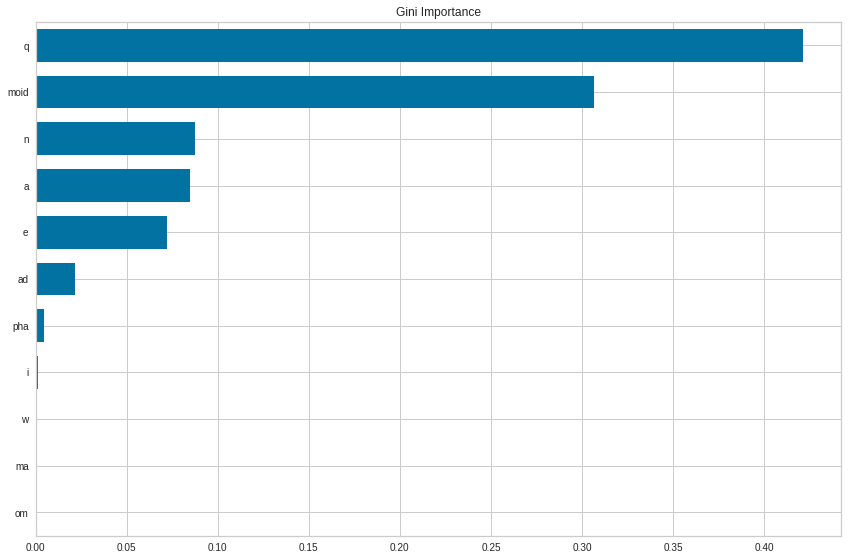

In [ ]:
rf = RandomForestClassifier(n_estimators=200, random_state=0)
rf.fit(X_train, y_train)
# result = permutation_importance(rf, X_train, y_train, n_repeats=10,
#                                 random_state=42)
# perm_sorted_idx = result.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(rf.feature_importances_)
tree_indices = np.arange(0, len(rf.feature_importances_)) + 0.5

fig, ax = plt.subplots()

#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
ax.barh(tree_indices,
         rf.feature_importances_[tree_importance_sorted_idx], height=0.7)
ax.set_yticklabels(X.columns[tree_importance_sorted_idx])
ax.set_yticks(tree_indices)
ax.set_ylim((0, len(rf.feature_importances_)))
ax.set_title("Gini Importance")
# ax2.set_title("Permutation Importances")
# ax2.boxplot(result.importances[perm_sorted_idx].T, vert=False,
#             labels=X.columns[perm_sorted_idx])
fig.tight_layout()
plt.show()

### Using Shap Values Feature Importance


In [ ]:
!pip install shap
import shap

In [ ]:
# Feature importance using showing Shap
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_train)


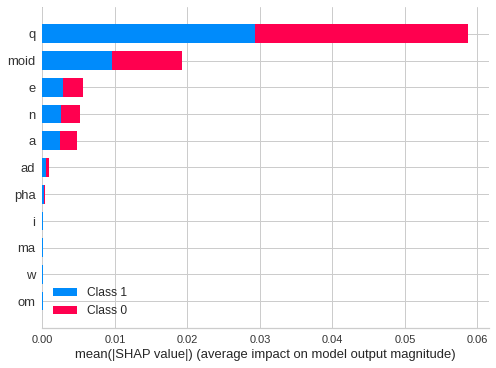

In [ ]:
shap.summary_plot(shap_values, X_train, plot_type="bar")


## **4.2 Classification**

Identifying NEA's

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
#from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis


In [ ]:
# If restarted always run the Import Libraries and authenticate using your google drive account
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/nasa_jpl_cleaned.csv'

df_orbit = pd.read_csv(path)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
df_orbit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1068754 entries, 0 to 1068753
Data columns (total 15 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   spkid      1068754 non-null  int64  
 1   full_name  1068754 non-null  object 
 2   pdes       1068754 non-null  object 
 3   e          1068754 non-null  float64
 4   a          1068754 non-null  float64
 5   q          1068754 non-null  float64
 6   i          1068754 non-null  float64
 7   om         1068754 non-null  float64
 8   w          1068754 non-null  float64
 9   ma         1068754 non-null  float64
 10  ad         1068754 non-null  float64
 11  n          1068754 non-null  float64
 12  moid       1068754 non-null  float64
 13  neo        1068754 non-null  object 
 14  pha        1068754 non-null  object 
dtypes: float64(10), int64(1), object(4)
memory usage: 122.3+ MB


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(df_orbit['neo'])
df_orbit['neo']=le.transform(df_orbit['neo'])
le.fit(df_orbit['pha'])
df_orbit['pha']=le.transform(df_orbit['pha'])

In [ ]:
X = df_orbit.iloc[:,[3,4,5,6,7,8,9,10,11,12, 14]]
Y = df_orbit.iloc[:, [13]].values

In [ ]:
names = ["Nearest Neighbors", "Linear SVM",
         #"RBF SVM",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes"]


classifiers = [
    KNeighborsClassifier(2),
    SVC(kernel="linear", C=0.025),
    #SVC(gamma=2, C=1),
    # GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB()
]


X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.33)

In [ ]:
from datetime import datetime
from datetime import date
import time
max_score = 0.0
max_class = ''
results =[]
accuracies = []
txtval = ''
map = {}
# iterate over classifiers
for name, clf in zip(names, classifiers):
    start_time = datetime.now()
    clf.fit(X_train, np.ravel(y_train))
    score = 100.0 * clf.score(X_test, y_test)
    nm=name+'='
    #txtvl = str(score)
    #accuracies.append(nm+txtvl)
    map.__setitem__(name,score)
    delta_time = datetime.now() - start_time
    results.append(clf.score(X_test, y_test))
    print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds,' %(delta_time.total_seconds()))

    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))

Classifier = Nearest Neighbors, Score (test, accuracy) = 97.56, Training time = 40.82 seconds,
Classifier = Linear SVM, Score (test, accuracy) = 99.97, Training time = 660.80 seconds,
Classifier = Decision Tree, Score (test, accuracy) = 100.00, Training time = 1.47 seconds,
Classifier = Random Forest, Score (test, accuracy) = 99.99, Training time = 5.01 seconds,
Classifier = Neural Net, Score (test, accuracy) = 99.73, Training time = 139.21 seconds,
Classifier = AdaBoost, Score (test, accuracy) = 100.00, Training time = 1.77 seconds,
Classifier = Naive Bayes, Score (test, accuracy) = 99.76, Training time = 0.26 seconds,
--------------------------------------------------------------------------------
Best --> Classifier = Decision Tree, Score (test, accuracy) = 100.00


Show the accuracy of top 4 models

In [ ]:
from heapq import nlargest
list_acc=[]
list_name=[]
topFour = nlargest(4, map, key = map.get)
for key in topFour:
    print(key, ":", map.get(key))
    list_acc.append(map.get(key))
    list_name.append(key)

Decision Tree : 100.0
AdaBoost : 100.0
Random Forest : 99.96937812066722
Linear SVM : 99.963990938192


No handles with labels found to put in legend.


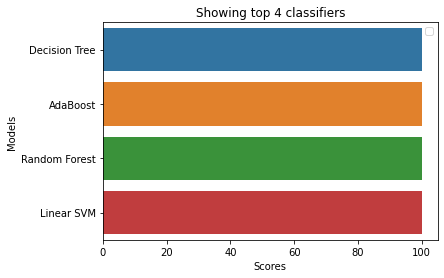

In [ ]:
# Creating a bar plot
sns.barplot(x=list_acc, y=list_name)
plt.xlabel('Scores')
plt.ylabel('Models')
plt.title("Showing top 4 classifiers")
plt.legend()
plt.rcParams['figure.figsize'] = (100,10)
plt.tick_params(axis='x', which='major', labelsize=10)

plt.show()

In [ ]:
!pip install eli5
from yellowbrick import ROCAUC
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport
from eli5 import explain_weights
from eli5.sklearn import PermutationImportance
import eli5

     |████████████████████████████████| 112kB 17.7MB/s 


The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.


In [ ]:
y_pred = clf_best.predict(X_test)

Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm

array([[344211,      0],
       [     0,   8478]])

Text(69.0, 0.5, 'Truth')

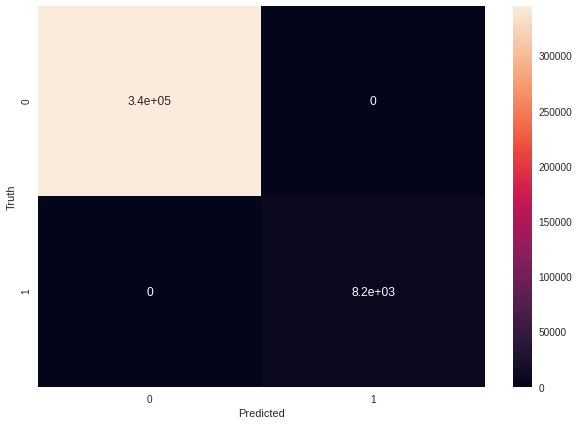

In [ ]:
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    344324
           1       1.00      1.00      1.00      8365

    accuracy                           1.00    352689
   macro avg       1.00      1.00      1.00    352689
weighted avg       1.00      1.00      1.00    352689



### Saving the model

In [ ]:
import pickle

filename = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/pickle files/classification_model.sav'

pickle.dump(clf_best, open(filename, 'wb'))

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))

# Load the saved model and evaluating it provides an estimate of accuracy of the model on test data.
result = loaded_model.score(X_test, y_test)
print(result)

1.0


In [ ]:
#selecting only NEA's
df_orbit_clean = df_orbit[df_orbit['neo'] == 1]

In [ ]:
df_orbit_clean

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha
432,2000433,433 Eros (A898 PA),433,0.222994,1.458167,1.133005,10.830513,304.299134,178.868934,23.041748,1.783330,0.559749,0.148573,1,0
718,2000719,719 Albert (A911 TB),719,0.546721,2.638378,1.195922,11.570400,183.858337,156.191211,186.243080,4.080833,0.229985,0.201325,1,0
886,2000887,887 Alinda (A918 AA),887,0.570422,2.473534,1.062575,9.393848,110.433731,350.512506,345.243767,3.884493,0.253354,0.081753,1,0
1035,2001036,1036 Ganymed (A924 UB),1036,0.533095,2.665194,1.244392,26.676143,215.544210,132.378538,50.117962,4.085995,0.226522,0.343891,1,0
1220,2001221,1221 Amor (1932 EA1),1221,0.435488,1.919166,1.083392,11.880444,171.316487,26.677583,112.664863,2.754939,0.370711,0.106469,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1068747,54133137,(2021 FJ3),2021 FJ3,0.532783,1.826332,0.853293,5.245191,31.431554,240.115896,332.075181,2.799370,0.399332,0.006856,1,0
1068748,54133138,(2021 FK3),2021 FK3,0.540984,1.737112,0.797363,6.420811,14.261702,266.119111,326.606720,2.676862,0.430489,0.038085,1,0
1068749,54133142,(2021 FL3),2021 FL3,0.376918,1.247934,0.777564,3.692176,136.670451,329.491781,41.436077,1.718303,0.706996,0.047322,1,0
1068750,54133143,(2021 FM3),2021 FM3,0.215539,1.256569,0.985730,6.521225,12.292743,145.978375,308.067463,1.527409,0.699720,0.013208,1,0


In [ ]:
# Save cleaned data
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/jpl_nea.csv'

df_orbit_clean.to_csv(path, index=False)

## **4.3 Resampling Data Visualization**

4.3.1 Install Hovoviz's tools to perform data visulization on classification

In [ ]:
# must restart the runtime
# if you see the restart runtime error, re-run this code of line
!pip install -U bokeh ipykernel holoviews

Requirement already up-to-date: bokeh in /usr/local/lib/python3.7/dist-packages (2.3.0)
Requirement already up-to-date: ipykernel in /usr/local/lib/python3.7/dist-packages (5.5.3)
Requirement already up-to-date: holoviews in /usr/local/lib/python3.7/dist-packages (1.14.2)


In [ ]:
! pip install git+https://github.com/smazzanti/confusion_viz

  Cloning https://github.com/smazzanti/confusion_viz to /tmp/pip-req-build-3lvit29p
  Running command git clone -q https://github.com/smazzanti/confusion_viz /tmp/pip-req-build-3lvit29p
     |████████████████████████████████| 13.2MB 339kB/s 
  Created wheel for confusion-viz: filename=confusion_viz-0.1-cp37-none-any.whl size=4107 sha256=aad4eae4757a5bdbf81ad0ec16fb6b2ad6ef33ee4c1d9ecc6d0bd7b3d1b1b3b4
  Stored in directory: /tmp/pip-ephem-wheel-cache-ce047mwl/wheels/ba/84/00/ddc4a59ccffe9a3e66758f2e0a1cdaf241e8259aab60364866
Successfully built confusion-viz
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [ ]:
!pip install hvplot
!pip install panel

     |████████████████████████████████| 3.1MB 6.9MB/s 


### 4.3.2 Holoviz - interactive chart

In [ ]:
import numba as nb
import holoviews as hv
import panel as pn

from matplotlib import cm

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
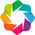

In [ ]:
hv.extension('bokeh', 'matplotlib')
pn.extension()

In [ ]:
probas_test = clf_best.predict_proba(X_test)[:,1]

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
# the garph could not show on Colab, but it can show on Jupyter Notebook
from confusion_viz import ConfusionViz

conf_viz = ConfusionViz()

conf_viz.fit(
    y_true = y_test,
    probas_pred = probas_test
)

conf_viz.show()    # shows plot in notebook mode

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score, roc_curve

In [ ]:
def generate_model_report(y_actual, y_predicted):
    print("Accuracy = ", accuracy_score(y_actual, y_predicted))
    print("Precision = ", precision_score(y_actual, y_predicted))
    print("Recall = ", recall_score(y_actual, y_predicted))
    print("F1 Score = ", f1_score(y_actual, y_predicted))
    pass

In [ ]:
def generate_auc_roc_curve(clf, X_test):
    y_pred_proba = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label="AUC ROC Curve = "+str(auc))
    plt.legend(loc=4)
    plt.show()
    pass

In [ ]:
y_train.value_counts()

0    698993
1     17072
Name: neo, dtype: int64

### 4.3.3 Down Sampling

In [ ]:
# drop 80% of data from the side has most values, to make it balanced
from collections import Counter
from imblearn.under_sampling import NearMiss
ns = NearMiss(0.8)
X_train_ns, y_train_ns = ns.fit_resample(X_train, y_train.ravel())
print("Before: ", Counter(y_train))
print("After: ", Counter(y_train_ns))

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/loca

Before:  Counter({0: 698993, 1: 17072})
After:  Counter({0: 21340, 1: 17072})


In [ ]:
clf_best2 = DecisionTreeClassifier(max_depth=5)
clf_best2.fit(X_train_ns, y_train_ns)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### 4.3.4 Over Sampling

In [ ]:
from imblearn.over_sampling import RandomOverSampler

In [ ]:
# increase 50% of data from the side has less values
os = RandomOverSampler(0.5)
X_train_ns, y_train_ns = ns.fit_resample(X_train, y_train.ravel())
print("Before: ", Counter(y_train))
print("After: ", Counter(y_train_ns))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Before:  Counter({0: 698993, 1: 17072})
After:  Counter({0: 21340, 1: 17072})


In [ ]:
clf_best3 = DecisionTreeClassifier(max_depth=5)
clf_best3.fit(X_train_ns, y_train_ns)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### 4.3.5 Reactive - Data Visualization

In [ ]:
import plotly.express as px
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve, average_precision_score
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [ ]:
def down_sampling():
    y_pred = clf_best2.predict(X_test)
    print(confusion_matrix(y_test, y_pred))
    print(accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))

    fpr, tpr, thresholds = roc_curve(y_test, y_pred)

    fig = px.area(
        x=fpr, y=tpr,
        title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
        labels=dict(x='False Positive Rate', y='True Positive Rate'),
        width=700, height=500
    )
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    fig.show()

In [ ]:
def up_sampling():
    y_pred = clf_best3.predict(X_test)
    print(confusion_matrix(y_test, y_pred))
    print(accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))

    fpr, tpr, thresholds = roc_curve(y_test, y_pred)

    fig = px.area(
        x=fpr, y=tpr,
        title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
        labels=dict(x='False Positive Rate', y='True Positive Rate'),
        width=700, height=500
    )
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    fig.show()

In [ ]:
## Defining slider here.
def Slider(total_spending):
  if (total_spending == 1):
    print("Original data")
    print(generate_model_report(y_test, y_pred))
    generate_auc_roc_curve(clf_best, X_test)
  elif (total_spending == 2):
    print ("Performed downsampling")
    down_sampling()
  else:
    print ("Perfromed upsampling")
    up_sampling()


In [ ]:
interact(Slider, total_spending=(0,2))

interactive(children=(IntSlider(value=1, description='total_spending', max=2), Output()), _dom_classes=('widge…

<function __main__.Slider>

Further analysis, about the near Earth asteroids

In [ ]:
#selecting only NEA's
df_orbit_clean = df_orbit[df_orbit['neo'] == 1]

In [ ]:
df_orbit_clean

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha
432,2000433,433 Eros (A898 PA),433,0.222994,1.458167,1.133005,10.830513,304.299134,178.868934,23.041748,1.783330,0.559749,0.148573,1,0
718,2000719,719 Albert (A911 TB),719,0.546721,2.638378,1.195922,11.570400,183.858337,156.191211,186.243080,4.080833,0.229985,0.201325,1,0
886,2000887,887 Alinda (A918 AA),887,0.570422,2.473534,1.062575,9.393848,110.433731,350.512506,345.243767,3.884493,0.253354,0.081753,1,0
1035,2001036,1036 Ganymed (A924 UB),1036,0.533095,2.665194,1.244392,26.676143,215.544210,132.378538,50.117962,4.085995,0.226522,0.343891,1,0
1220,2001221,1221 Amor (1932 EA1),1221,0.435488,1.919166,1.083392,11.880444,171.316487,26.677583,112.664863,2.754939,0.370711,0.106469,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1068747,54133137,(2021 FJ3),2021 FJ3,0.532783,1.826332,0.853293,5.245191,31.431554,240.115896,332.075181,2.799370,0.399332,0.006856,1,0
1068748,54133138,(2021 FK3),2021 FK3,0.540984,1.737112,0.797363,6.420811,14.261702,266.119111,326.606720,2.676862,0.430489,0.038085,1,0
1068749,54133142,(2021 FL3),2021 FL3,0.376918,1.247934,0.777564,3.692176,136.670451,329.491781,41.436077,1.718303,0.706996,0.047322,1,0
1068750,54133143,(2021 FM3),2021 FM3,0.215539,1.256569,0.985730,6.521225,12.292743,145.978375,308.067463,1.527409,0.699720,0.013208,1,0


In [ ]:
# Save cleaned data
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/jpl_nea.csv'

df_orbit_clean.to_csv(path, index=False)

# **5. Applied ML Algorithms for Finding Earth Crossing Near Earth Asteroids**
There are 2 types of earth crossing NEA's - Apollos and Atens - i) Apollos - a (semi-major axis) > 1, q (perihelion distance) < 1.017 au ii) Atens - a (semi-major axis) < 1 and ad (aphelion distance) >0.983 au.
Narrative:
1) Fractal clustering( perform clustering many times till the condition is met) based on semi-major-axis and eccentricity was performed for 6 rounds to find the golden cluster. The asteroids in this cluster can be assumed to be potentially dangerous amongst all asteroids.

2) K-Means clustering was implemented and to find the optimum number of k for clustering, SSE score and Silhoutte score was plotted for k=1-10 and the ideal value was selected.

3) There were 619 asteroids in the golden cluster and asteroids which are physically hazardous amongst them was chosen next (113 asteroids) and are assumed to be the most dangerous.



## **5.1 Fractal Clustering**
 Identifying Earth crossing NEA's
 There are 2 types:
 i) Apollos - a (semi-major axis) > 1, q (perihelion distance) < 1.017 au
 ii) Atens - a (semi-major axis) < 1 and ad (aphelion distance) >0.983 au

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/jpl_nea.csv'

df_orbit_nea = pd.read_csv(path)

In [ ]:
df_orbit_nea.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25402 entries, 0 to 25401
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   spkid      25402 non-null  int64  
 1   full_name  25402 non-null  object 
 2   pdes       25402 non-null  object 
 3   e          25402 non-null  float64
 4   a          25402 non-null  float64
 5   q          25402 non-null  float64
 6   i          25402 non-null  float64
 7   om         25402 non-null  float64
 8   w          25402 non-null  float64
 9   ma         25402 non-null  float64
 10  ad         25402 non-null  float64
 11  n          25402 non-null  float64
 12  moid       25402 non-null  float64
 13  neo        25402 non-null  int64  
 14  pha        25402 non-null  int64  
dtypes: float64(10), int64(3), object(2)
memory usage: 2.9+ MB


In [ ]:
#@title Get value of K using Elbow method, Silhouette score
from sklearn.cluster import KMeans
from sklearn import metrics

def get_number_of_clusters(X,max_cluster_size=15):
 ''' function to find the number of optimum clusters using Elbow method and Silhouette score'''
 sse_within_cluster = {}
 silhouette_score = {}

 for i in range(2, max_cluster_size):
  kmeans = KMeans(n_clusters=i, random_state=42, init = 'k-means++', n_jobs=-1)
  kmeans.fit(X)
  sse_within_cluster[i] = kmeans.inertia_
  silhouette_score[i] = metrics.silhouette_score(X, kmeans.labels_, random_state=42)

 plt.figure(figsize=(10,6))
 ax1 = plt.subplot(211)
 plt.plot(list(sse_within_cluster.keys()), list(sse_within_cluster.values()))
 plt.xlabel("Number of Clusters")
 plt.ylabel("SSE Within Cluster")
 plt.title("SSE Within Cluster  ")
 plt.xticks([i for i in range(1, max_cluster_size)], rotation=60)

 ax2 = plt.subplot(212)
 plt.plot(list(silhouette_score.keys()), list(silhouette_score.values()))
 plt.xlabel("Number of Clusters")
 plt.ylabel("Silhouette Score")
 plt.title("Silhouette Score Clustering")
 plt.xticks([i for i in range(1, max_cluster_size)], rotation=60)

 plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.5, wspace=0.35)

In [ ]:
#@title Apply K-Means
def apply_clusters(data, k):
  ''' Function to apply K-means clustering on the dataframe'''
  data.head(5)
  X = data.iloc[:,[3,4]].values
  #print(data.shape)
  #print(X)
  try:
      data.drop('cluster', axis=1, inplace=True)
  except:
      next
  kmeans = KMeans(n_clusters=k,init='k-means++',random_state=40)
  clusters = kmeans.fit_predict(X)
  km_centers = kmeans.cluster_centers_
  y_cluster_labels = kmeans.labels_
  #print(np.size(y_cluster_labels))
  # Draw the KMean clusters
  plt.figure(figsize=(15,8))
  plt.scatter(X[:,1], X[:,0],c=y_cluster_labels, s=50, cmap='viridis')
  plt.ylabel("Eccentricity")
  plt.xlabel("Semi-Major Axis")
  plt.scatter(km_centers[:, 0], km_centers[:, 1], c='r', s=800, alpha=0.3)
  #plt.legend(bbox_to_anchor=(1,1), loc='upper left')
  plt.show()
  # Cluster performance scores
  silhouette_score = metrics.silhouette_score(X, kmeans.labels_, random_state=40)
  SSE = kmeans.inertia_
  print("Cluster performance")
  print("----------------------")
  print("SSE " + str(SSE))
  print("Silhouette Score " + str(silhouette_score))
  print(" ")

  data['cluster'] = kmeans.labels_
  return data

### Round1

In [ ]:
X1 = df_orbit_nea.iloc[:,[4,3]]

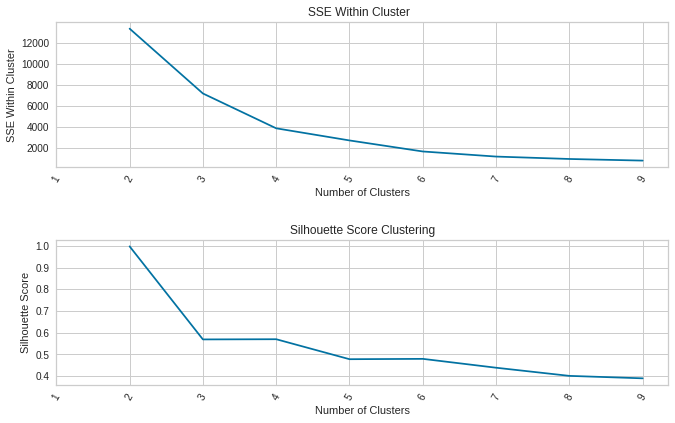

In [ ]:
get_number_of_clusters(X1, max_cluster_size=10)

k = 5

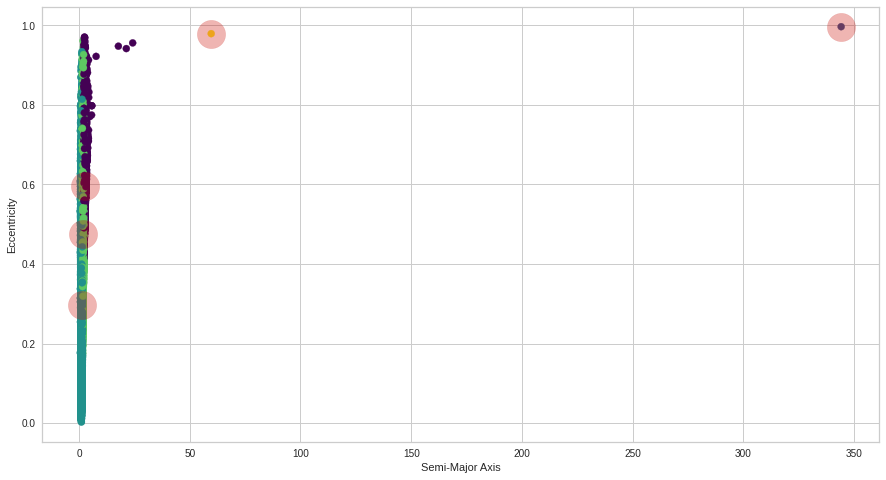

Cluster performance
----------------------
SSE 2745.06169287704
Silhouette Score 0.4784347088798163
 


In [ ]:
first_fractal_cluster = apply_clusters(df_orbit_nea, 5)

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


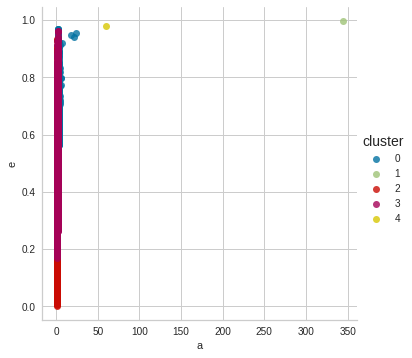

In [ ]:
import seaborn as sns
sns.lmplot('a','e', data= df_orbit_nea, hue='cluster', fit_reg=False)
plt.show()

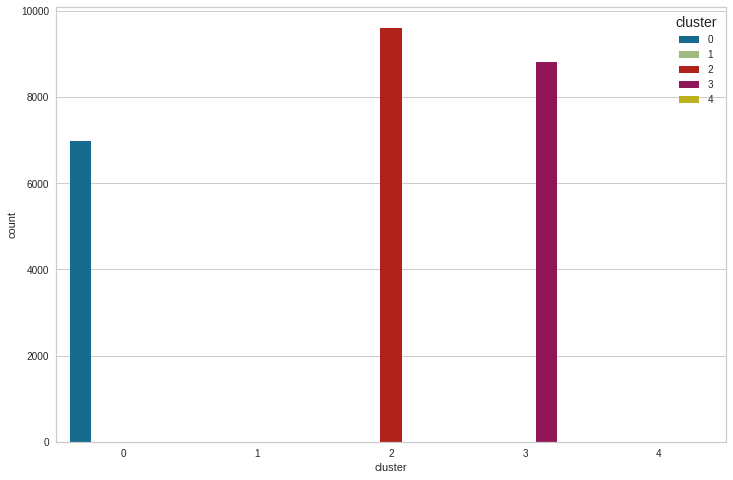

In [ ]:
sns.countplot(x='cluster',hue='cluster',data=df_orbit_nea)

***Since there is only 1 asteroid in cluster 1 and 4, all asteroids in the remaining clusters are considered for the next round of fractal clustering ***

In [ ]:
Fractal1_data = pd.concat([df_orbit_nea.loc[df_orbit_nea['cluster'] == 2],  df_orbit_nea.loc[df_orbit_nea['cluster'] == 0], df_orbit_nea.loc[df_orbit_nea['cluster'] == 3]])
Fractal1_data

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,cluster
0,2000433,433 Eros (A898 PA),433,0.222994,1.458167,1.133005,10.830513,304.299134,178.868934,23.041748,1.783330,0.559749,0.148573,1,0,2
5,2001566,1566 Icarus (1949 MA),1566,0.827073,1.078076,0.186429,22.818819,87.989113,31.406971,8.160599,1.969724,0.880501,0.033700,1,1,2
7,2001620,1620 Geographos (1951 RA),1620,0.335454,1.245655,0.827795,13.337390,337.185633,276.963890,16.892430,1.663515,0.708936,0.029221,1,1,2
9,2001685,1685 Toro (1948 OA),1685,0.435853,1.367568,0.771510,9.382597,274.241451,127.221529,53.501956,1.963626,0.616284,0.050776,1,0,2
13,2001865,1865 Cerberus (1971 UA),1865,0.466933,1.079992,0.575708,16.096614,212.910559,325.255787,178.942500,1.584275,0.878159,0.156379,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25379,54132436,(2021 FH2),2021 FH2,0.454697,1.989332,1.084790,14.587383,172.669082,25.632800,355.586760,2.893875,0.351272,0.110697,1,0,3
25380,54132437,(2021 FJ2),2021 FJ2,0.516257,2.102994,1.017308,7.321125,180.757514,4.797286,328.134277,3.188681,0.323182,0.020722,1,0,3
25394,54132974,(2021 FF3),2021 FF3,0.319253,1.770637,1.205356,18.358763,179.227290,9.729173,358.682647,2.335919,0.418321,0.211333,1,0,3
25397,54133137,(2021 FJ3),2021 FJ3,0.532783,1.826332,0.853293,5.245191,31.431554,240.115896,332.075181,2.799370,0.399332,0.006856,1,0,3


### Round 2

In [ ]:
X1 = Fractal1_data.iloc[:,[4,3]]

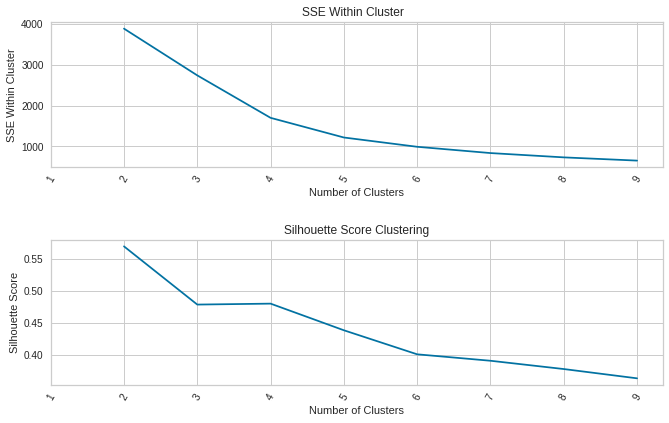

In [ ]:
get_number_of_clusters(X1, max_cluster_size=10)

k = 4

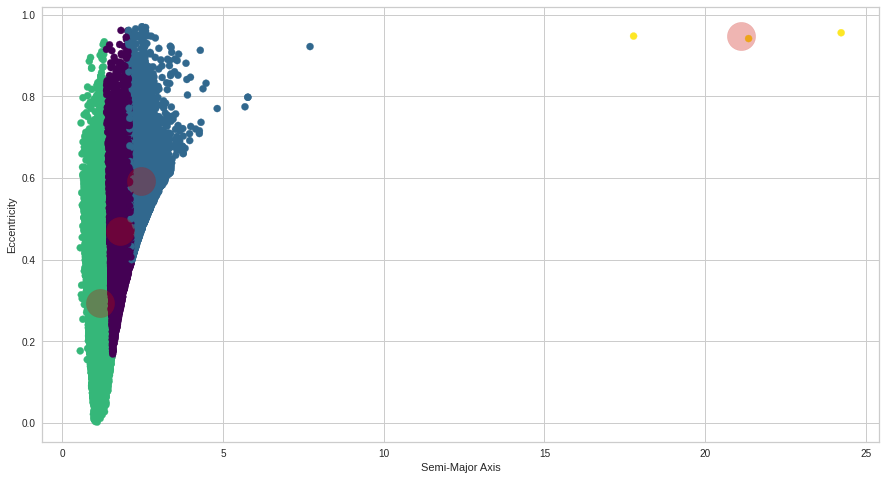

Cluster performance
----------------------
SSE 1703.2772918677986
Silhouette Score 0.47930972935622
 


In [ ]:
second_fractal_cluster = apply_clusters(Fractal1_data, 4)

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


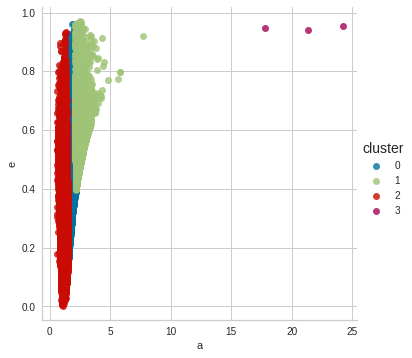

In [ ]:
sns.lmplot('a','e', data= Fractal1_data, hue='cluster', fit_reg=False)
plt.show()

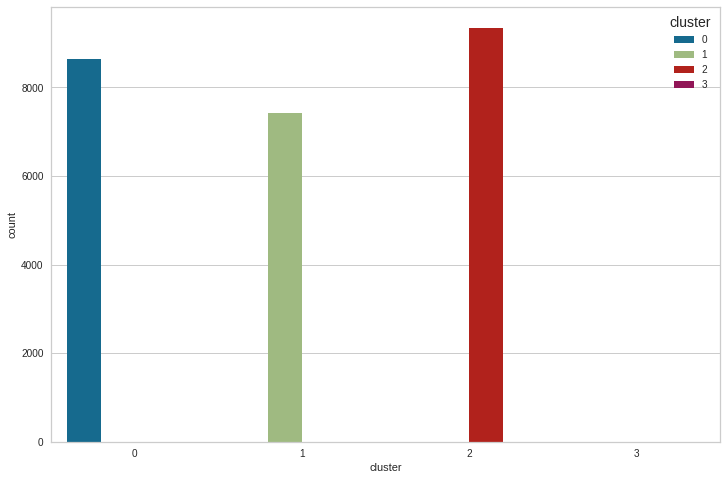

In [ ]:
sns.countplot(x='cluster',hue='cluster',data=Fractal1_data)

**Since there are very few asteroids in cluster 3, all asteroids in the remaining clusters are considered for the next round of fractal clustering**

In [ ]:
Fractal2_data = pd.concat([Fractal1_data.loc[Fractal1_data['cluster'] == 0],  Fractal1_data.loc[Fractal1_data['cluster'] == 1], Fractal1_data.loc[Fractal1_data['cluster'] == 2]])
Fractal2_data

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,cluster
75,2004660,4660 Nereus (1982 DB),4660,0.360216,1.488887,0.952567,1.432077,314.405337,158.085789,150.447743,2.025208,0.542514,0.003326,1,1,0
135,2007753,7753 (1988 XB),7753,0.481572,1.467118,0.760596,3.124706,73.407106,280.033938,39.394192,2.173641,0.554634,0.006574,1,1,0
155,2009202,9202 (1993 PB),9202,0.607563,1.423902,0.558791,40.823805,315.921259,212.322243,132.859302,2.289012,0.580075,0.373253,1,0,0
188,2016834,16834 (1997 WU22),16834,0.442073,1.467928,0.818997,15.989657,260.797704,334.326872,191.717855,2.116860,0.554175,0.146944,1,0,0
314,2066251,66251 (1999 GJ2),66251,0.197963,1.535502,1.231529,11.278305,196.204794,142.457835,20.096197,1.839476,0.517998,0.246924,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25391,54132971,(2021 FC3),2021 FC3,0.249669,1.256461,0.942762,0.682048,326.878388,160.152616,35.175001,1.570160,0.699811,0.004374,1,0,2
25392,54132972,(2021 FD3),2021 FD3,0.352711,1.384846,0.896395,8.102813,183.574343,55.221414,274.160266,1.873296,0.604786,0.005641,1,0,2
25393,54132973,(2021 FE3),2021 FE3,0.265742,1.221628,0.896990,11.906427,14.547770,100.725694,40.724841,1.546267,0.729954,0.054218,1,0,2
25399,54133142,(2021 FL3),2021 FL3,0.376918,1.247934,0.777564,3.692176,136.670451,329.491781,41.436077,1.718303,0.706996,0.047322,1,0,2


### Round 3

In [ ]:
X1 = Fractal2_data.iloc[:,[3,4]]

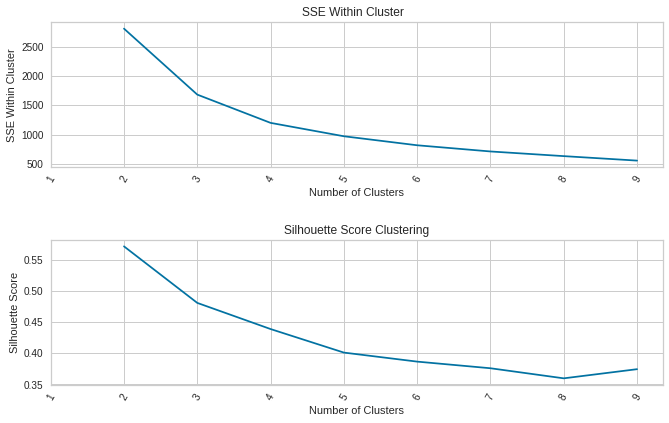

In [ ]:
get_number_of_clusters(X1, max_cluster_size=10)

k = 3

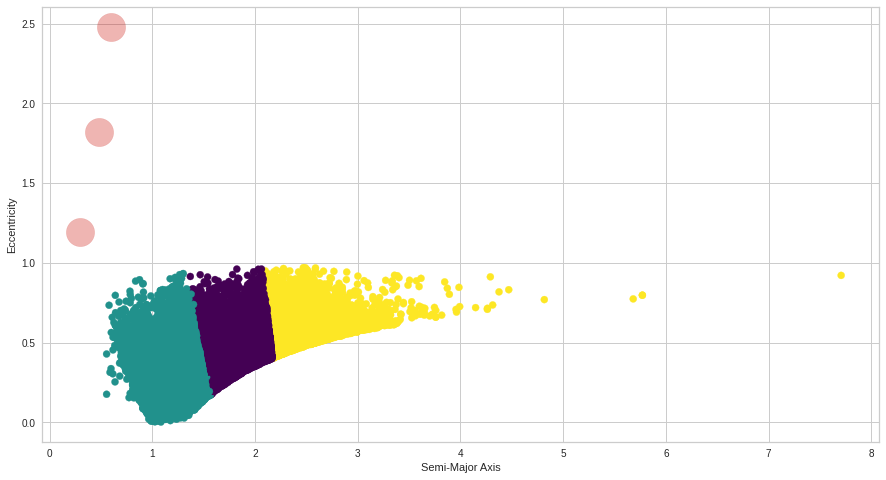

Cluster performance
----------------------
SSE 1681.9381027154477
Silhouette Score 0.4805250987088273
 


In [ ]:
third_fractal_cluster = apply_clusters(Fractal2_data, 3)

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


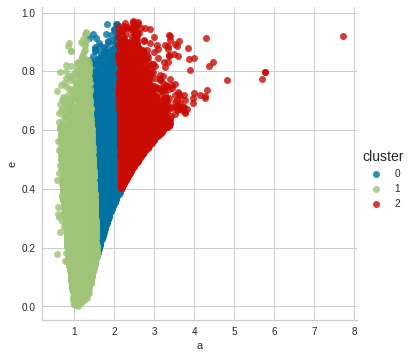

In [ ]:
sns.lmplot('a','e', data= Fractal2_data, hue='cluster', fit_reg=False)
plt.show()

In [ ]:
cluster_perf_df = (
    third_fractal_cluster
    .groupby('cluster')
    .agg({"a":"mean", "e":"mean","q":"mean", "ad":"mean", "moid":"mean"})
    .sort_values('a')
    .reset_index()
)

cluster_perf_df

,cluster,a,e,q,ad,moid
0,1,1.190490,0.298505,0.835224,1.545757,0.063080
1,0,1.815561,0.478041,0.941467,2.689656,0.093841
2,2,2.478774,0.597257,0.990462,3.967087,0.128157


**Clusters 0 and 1 satisfy the condition**

In [ ]:
Fractal3_data = pd.concat([Fractal2_data.loc[Fractal2_data['cluster'] == 0],  Fractal2_data.loc[Fractal2_data['cluster'] == 1]])
Fractal3_data

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,cluster
4,2001221,1221 Amor (1932 EA1),1221,0.435488,1.919166,1.083392,11.880444,171.316487,26.677583,112.664863,2.754939,0.370711,0.106469,1,0,0
8,2001627,1627 Ivar (1929 SH),1627,0.396837,1.863156,1.123787,8.452023,133.119764,167.805446,334.006447,2.602525,0.387552,0.109831,1,0,0
10,2001862,1862 Apollo (1932 HA),1862,0.559950,1.470372,0.647037,6.354774,35.617197,285.991915,199.087018,2.293708,0.552794,0.026045,1,1,0
12,2001864,1864 Daedalus (1971 FA),1864,0.614533,1.460868,0.563116,22.213803,6.620877,325.638621,332.868420,2.358619,0.558197,0.268934,1,0,0
14,2001866,1866 Sisyphus (1972 XA),1866,0.538194,1.893569,0.874461,41.200171,63.481538,293.066881,179.830571,2.912677,0.378253,0.103755,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25391,54132971,(2021 FC3),2021 FC3,0.249669,1.256461,0.942762,0.682048,326.878388,160.152616,35.175001,1.570160,0.699811,0.004374,1,0,1
25392,54132972,(2021 FD3),2021 FD3,0.352711,1.384846,0.896395,8.102813,183.574343,55.221414,274.160266,1.873296,0.604786,0.005641,1,0,1
25393,54132973,(2021 FE3),2021 FE3,0.265742,1.221628,0.896990,11.906427,14.547770,100.725694,40.724841,1.546267,0.729954,0.054218,1,0,1
25399,54133142,(2021 FL3),2021 FL3,0.376918,1.247934,0.777564,3.692176,136.670451,329.491781,41.436077,1.718303,0.706996,0.047322,1,0,1


### Round 4

In [ ]:
X1 = Fractal3_data.iloc[:,[3,4]]

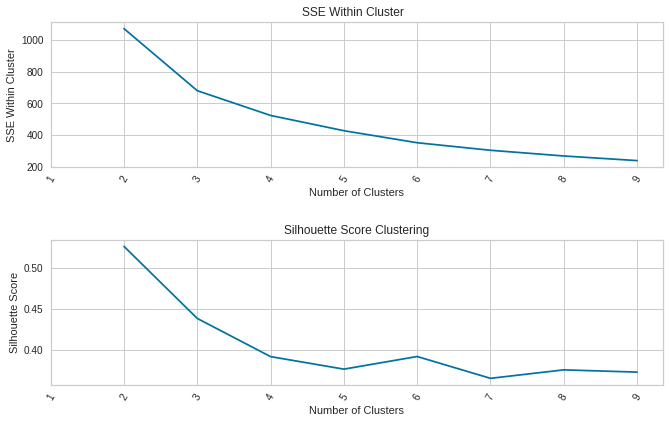

In [ ]:
get_number_of_clusters(X1, max_cluster_size=10)

k = 4

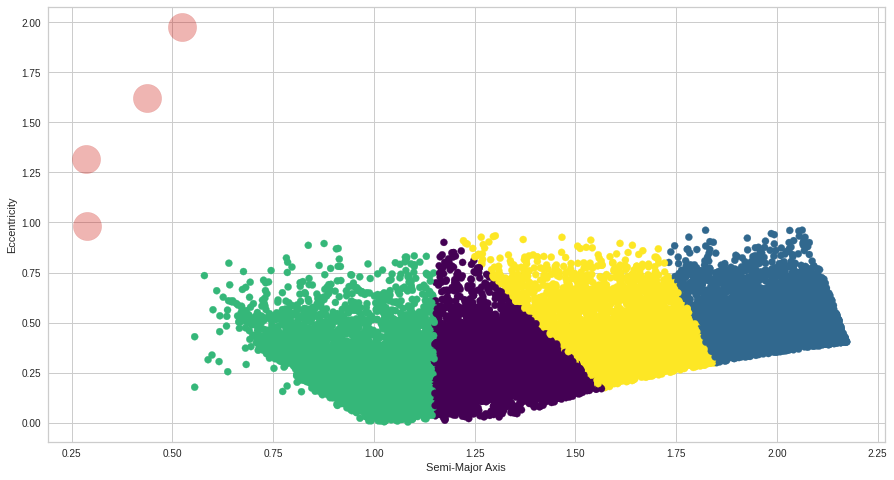

Cluster performance
----------------------
SSE 524.2106890545547
Silhouette Score 0.39208062893709544
 


In [ ]:
fourth_fractal_cluster = apply_clusters(Fractal3_data, 4)

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


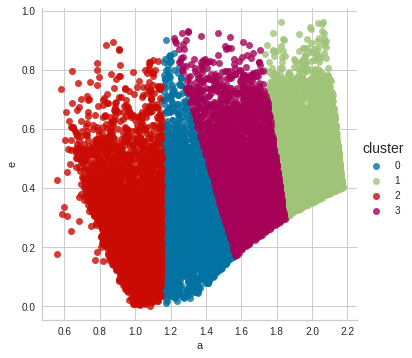

In [ ]:
sns.lmplot('a','e', data= Fractal3_data, hue='cluster', fit_reg=False)
plt.show()

In [ ]:
cluster_perf_df = (
    fourth_fractal_cluster
    .groupby('cluster')
    .agg({"a":"mean", "e":"mean","q":"mean", "ad":"mean", "moid":"mean"})
    .sort_values('a')
    .reset_index()
)

cluster_perf_df

,cluster,a,e,q,ad,moid
0,2,0.981265,0.287192,0.705237,1.257294,0.046405
1,0,1.317042,0.286244,0.940264,1.693819,0.074169
2,3,1.625262,0.436634,0.919161,2.331364,0.093104
3,1,1.979026,0.523502,0.943848,3.014205,0.092026


**cluster 2  satisfies the condition**

In [ ]:
Fractal4_data = Fractal3_data.loc[Fractal3_data['cluster'] == 2]
Fractal4_data

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,cluster
5,2001566,1566 Icarus (1949 MA),1566,0.827073,1.078076,0.186429,22.818819,87.989113,31.406971,8.160599,1.969724,0.880501,0.033700,1,1,2
13,2001865,1865 Cerberus (1971 UA),1865,0.466933,1.079992,0.575708,16.096614,212.910559,325.255787,178.942500,1.584275,0.878159,0.156379,1,0,2
23,2002062,2062 Aten (1976 AA),2062,0.182717,0.966790,0.790141,18.933687,108.600376,148.035406,172.267763,1.143439,1.036826,0.113146,1,0,2
24,2002063,2063 Bacchus (1977 HB),2063,0.349513,1.078069,0.701270,9.431238,33.081774,55.362332,89.834429,1.454867,0.880510,0.066840,1,0,2
25,2002100,2100 Ra-Shalom (1978 RA),2100,0.436556,0.832038,0.468807,15.752894,170.799411,356.057650,71.490571,1.195269,1.298642,0.149539,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25365,54132420,(2021 FR1),2021 FR1,0.390107,1.080489,0.658983,6.938537,40.856328,277.293233,263.330086,1.501995,0.877553,0.012083,1,0,2
25375,54132431,(2021 FD2),2021 FD2,0.154561,1.121335,0.948021,7.814687,175.756944,286.599239,61.235339,1.294650,0.830044,0.039329,1,0,2
25387,54132514,(2021 FW2),2021 FW2,0.250923,0.920099,0.689225,2.561106,10.977747,302.860391,147.801118,1.150973,1.116741,0.000281,1,0,2
25388,54132515,(2021 FX2),2021 FX2,0.321738,1.087476,0.737594,10.003645,183.368784,98.479968,214.529430,1.437358,0.869110,0.011350,1,0,2


### Round 5

In [ ]:
X1 = Fractal4_data.iloc[:,[4,3]]

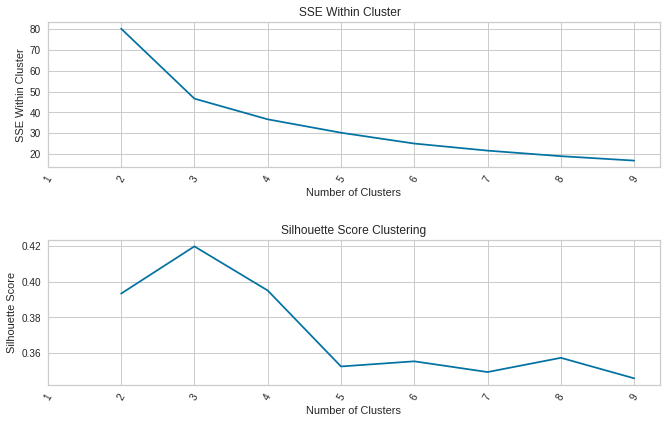

In [ ]:
get_number_of_clusters(X1, max_cluster_size=10)

k = 3


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


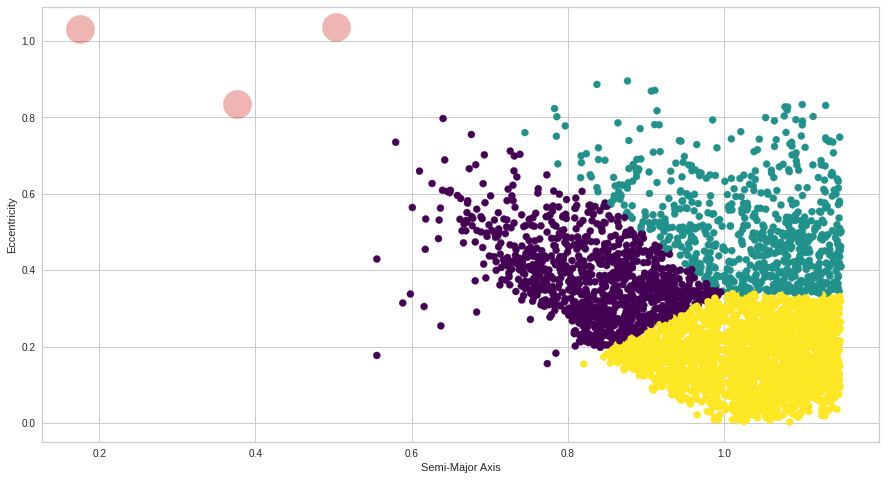

Cluster performance
----------------------
SSE 57.71053692902517
Silhouette Score 0.4290442998546018
 



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
fifth_fractal_cluster = apply_clusters(Fractal4_data, 3)

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


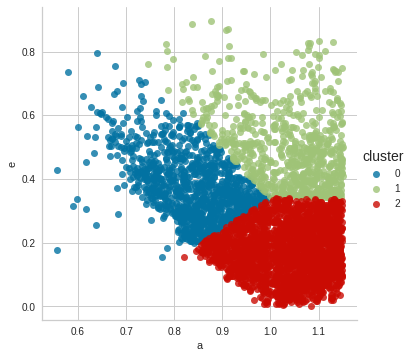

In [ ]:
sns.lmplot('a','e', data= Fractal4_data, hue='cluster', fit_reg=False)
plt.show()

In [ ]:
cluster_perf_df = (
    fifth_fractal_cluster
    .groupby('cluster')
    .agg({"a":"mean", "e":"mean","q":"mean", "ad":"mean", "moid":"mean"})
    .sort_values('a')
    .reset_index()
)

cluster_perf_df

,cluster,a,e,q,ad,moid
0,0,0.834686,0.376156,0.524165,1.145207,0.045574
1,2,1.031115,0.175719,0.849790,1.212440,0.035176
2,1,1.036685,0.502564,0.519308,1.554062,0.082012


**cluster 1 and 0 satisfy the condition**

In [ ]:
Fractal5_data = pd.concat([Fractal4_data.loc[Fractal4_data['cluster'] == 0],  Fractal4_data.loc[Fractal4_data['cluster'] == 1]])
Fractal5_data

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,cluster
25,2002100,2100 Ra-Shalom (1978 RA),2100,0.436556,0.832038,0.468807,15.752894,170.799411,356.057650,71.490571,1.195269,1.298642,0.149539,1,0,0
33,2002340,2340 Hathor (1976 UA),2340,0.449884,0.843829,0.464204,5.854591,211.542137,39.926294,42.104433,1.223455,1.271517,0.006874,1,1,0
89,2005381,5381 Sekhmet (1991 JY),5381,0.296338,0.947483,0.666708,48.965922,58.538347,37.427861,142.942682,1.228258,1.068678,0.111200,1,0,0
93,2005604,5604 (1992 FE),5604,0.406024,0.928577,0.551552,4.715352,311.909718,82.653362,167.904184,1.305602,1.101481,0.033723,1,1,0
248,2033342,33342 (1998 WT24),33342,0.417592,0.718866,0.418673,7.366757,81.686501,167.549598,283.122157,1.019060,1.617081,0.010689,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25253,54130498,(2021 EY1),2021 EY1,0.454756,0.998936,0.544663,6.103875,166.076393,121.024801,213.713743,1.453208,0.987183,0.008179,1,0,1
25254,54130499,(2021 EZ1),2021 EZ1,0.427340,1.028541,0.589004,7.380406,345.763265,67.787995,347.254705,1.468077,0.944869,0.002698,1,0,1
25302,54131390,(2021 EB4),2021 EB4,0.624770,1.032665,0.387487,44.744966,171.485747,131.863334,301.588962,1.677843,0.939215,0.055146,1,0,1
25303,54131391,(2021 EC4),2021 EC4,0.502259,0.949878,0.472793,7.321299,1.657518,303.965740,184.978364,1.426963,1.064639,0.002032,1,0,1


### Round 6

In [ ]:
X1 = Fractal5_data.iloc[:,[3,4]]

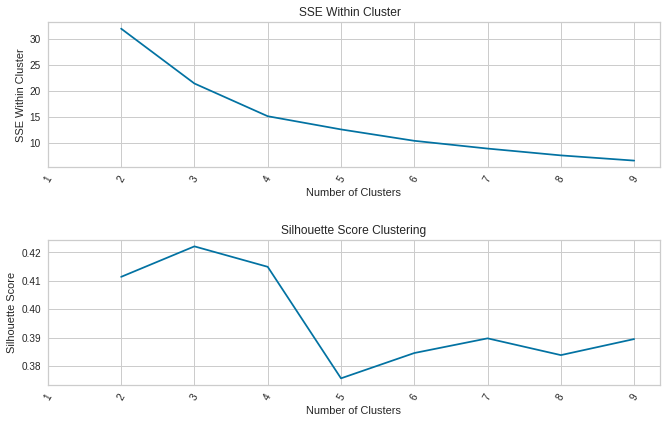

In [ ]:
get_number_of_clusters(X1, max_cluster_size=10)

k = 4

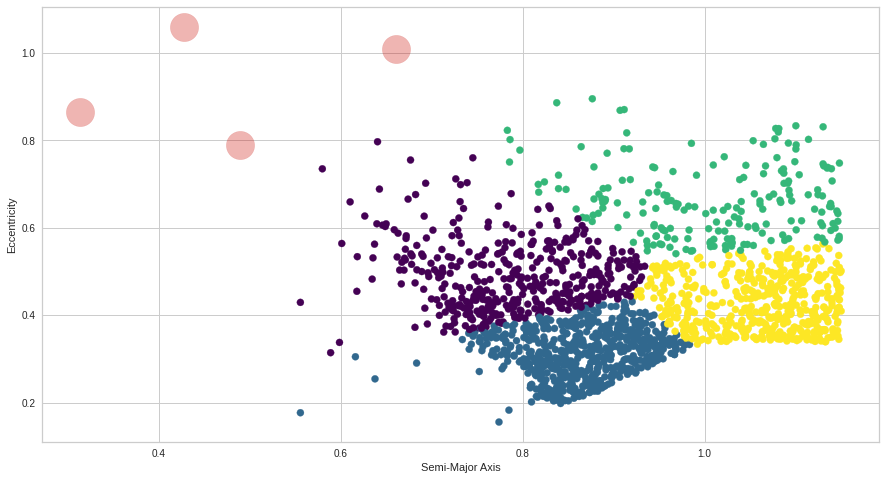

Cluster performance
----------------------
SSE 15.183449282611775
Silhouette Score 0.41493565658727805
 


In [ ]:
sixth_fractal_cluster = apply_clusters(Fractal5_data, 4)

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


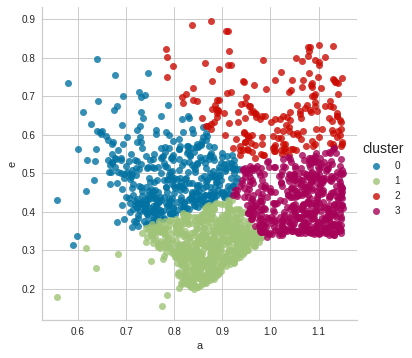

In [ ]:
sns.lmplot('a','e', data= Fractal5_data, hue='cluster', fit_reg=False)
plt.show()

In [ ]:
cluster_perf_df = (
    sixth_fractal_cluster
    .groupby('cluster')
    .agg({"a":"mean", "e":"mean","q":"mean", "ad":"mean", "moid":"mean"})
    .sort_values('a')
    .reset_index()
)

cluster_perf_df

,cluster,a,e,q,ad,moid
0,0,0.790071,0.488558,0.404636,1.175505,0.051423
1,1,0.864077,0.313347,0.592773,1.135382,0.042715
2,2,1.008291,0.660907,0.342681,1.673901,0.091366
3,3,1.059788,0.427545,0.606739,1.512837,0.078667


**clusters 0 and 2 satisfy the condition**

In [ ]:
Fractal6_data = pd.concat([Fractal5_data.loc[Fractal5_data['cluster'] == 0],  Fractal5_data.loc[Fractal5_data['cluster'] == 2]])
Fractal6_data

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,cluster
25,2002100,2100 Ra-Shalom (1978 RA),2100,0.436556,0.832038,0.468807,15.752894,170.799411,356.057650,71.490571,1.195269,1.298642,0.149539,1,0,0
33,2002340,2340 Hathor (1976 UA),2340,0.449884,0.843829,0.464204,5.854591,211.542137,39.926294,42.104433,1.223455,1.271517,0.006874,1,1,0
248,2033342,33342 (1998 WT24),33342,0.417592,0.718866,0.418673,7.366757,81.686501,167.549598,283.122157,1.019060,1.617081,0.010689,1,1,0
313,2066146,66146 (1998 TU3),66146,0.483694,0.787398,0.406538,5.409005,102.008008,84.836146,56.245003,1.168258,1.410628,0.073653,1,0,0
317,2066391,66391 Moshup (1999 KW4),66391,0.688395,0.642346,0.200158,38.882196,244.903192,192.643782,136.801305,1.084534,1.914478,0.011959,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24893,54106344,(2021 BK1),2021 BK1,0.721227,1.103969,0.307757,25.585066,300.326767,309.757564,317.293605,1.900181,0.849706,0.000330,1,0,2
24987,54110080,(2021 CV1),2021 CV1,0.674763,1.093401,0.355614,0.551078,1.657207,268.252194,311.587131,1.831187,0.862055,0.005501,1,0,2
25027,54111254,(2021 CR3),2021 CR3,0.642451,1.063783,0.380354,8.818479,150.239852,128.810185,304.009454,1.747211,0.898307,0.009911,1,0,2
25092,54121874,(2021 CB7),2021 CB7,0.672794,1.129490,0.369576,35.618048,351.112704,7.867310,56.453549,1.889404,0.821070,0.425527,1,0,2


all the above asteroids are earth crossing NEA's. For the purpose of testing for finding the impact of collision, will be considering only the physically hazardous asteroids

In [ ]:
df_nea_test = Fractal6_data[Fractal6_data['pha'] == 1]
df_nea_test

,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,cluster
33,2002340,2340 Hathor (1976 UA),2340,0.449884,0.843829,0.464204,5.854591,211.542137,39.926294,42.104433,1.223455,1.271517,0.006874,1,1,0
248,2033342,33342 (1998 WT24),33342,0.417592,0.718866,0.418673,7.366757,81.686501,167.549598,283.122157,1.019060,1.617081,0.010689,1,1,0
317,2066391,66391 Moshup (1999 KW4),66391,0.688395,0.642346,0.200158,38.882196,244.903192,192.643782,136.801305,1.084534,1.914478,0.011959,1,1,0
467,2138127,138127 (2000 EE14),138127,0.533052,0.661831,0.309040,26.462625,155.761180,197.836275,33.436644,1.014621,1.830559,0.023386,1,1,0
749,2163243,163243 (2002 FB3),163243,0.601695,0.761604,0.303351,20.278217,203.587261,148.310814,193.246087,1.219857,1.482895,0.003858,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19796,3840701,(2019 FZ),2019 FZ,0.628696,0.877360,0.325767,27.657671,192.463267,139.926271,312.512263,1.428953,1.199326,0.010962,1,1,2
20451,3843319,(2019 ND7),2019 ND7,0.574952,1.147853,0.487892,34.480345,297.394446,114.739432,11.863374,1.807813,0.801447,0.003792,1,1,2
21800,3986636,(2020 AD3),2020 AD3,0.594773,0.982848,0.398277,2.643620,268.469973,73.788296,47.195105,1.567420,1.011520,0.015693,1,1,2
22931,54017258,(2020 KK5),2020 KK5,0.633644,0.932226,0.341527,15.146783,83.270160,325.044172,100.920339,1.522926,1.095020,0.042324,1,1,2


In [ ]:
df_nea_test.reset_index()

,index,spkid,full_name,pdes,e,a,q,i,om,w,ma,ad,n,moid,neo,pha,cluster
0,33,2002340,2340 Hathor (1976 UA),2340,0.449884,0.843829,0.464204,5.854591,211.542137,39.926294,42.104433,1.223455,1.271517,0.006874,1,1,0
1,248,2033342,33342 (1998 WT24),33342,0.417592,0.718866,0.418673,7.366757,81.686501,167.549598,283.122157,1.019060,1.617081,0.010689,1,1,0
2,317,2066391,66391 Moshup (1999 KW4),66391,0.688395,0.642346,0.200158,38.882196,244.903192,192.643782,136.801305,1.084534,1.914478,0.011959,1,1,0
3,467,2138127,138127 (2000 EE14),138127,0.533052,0.661831,0.309040,26.462625,155.761180,197.836275,33.436644,1.014621,1.830559,0.023386,1,1,0
4,749,2163243,163243 (2002 FB3),163243,0.601695,0.761604,0.303351,20.278217,203.587261,148.310814,193.246087,1.219857,1.482895,0.003858,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,19796,3840701,(2019 FZ),2019 FZ,0.628696,0.877360,0.325767,27.657671,192.463267,139.926271,312.512263,1.428953,1.199326,0.010962,1,1,2
109,20451,3843319,(2019 ND7),2019 ND7,0.574952,1.147853,0.487892,34.480345,297.394446,114.739432,11.863374,1.807813,0.801447,0.003792,1,1,2
110,21800,3986636,(2020 AD3),2020 AD3,0.594773,0.982848,0.398277,2.643620,268.469973,73.788296,47.195105,1.567420,1.011520,0.015693,1,1,2
111,22931,54017258,(2020 KK5),2020 KK5,0.633644,0.932226,0.341527,15.146783,83.270160,325.044172,100.920339,1.522926,1.095020,0.042324,1,1,2


In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/test_nea.csv'

df_nea_test.to_csv(path, index=False)

# **6. Latent Variables Analysis on Impact of asteroids on earth**
To predict the impact of asteroids on earth, the impact data from the sentry website is used (path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/cneos_sentry_cleaned.csv').

Narrative:
1) To predict the impact of collision, 7 different regression models were run in a mullerloop and metrics like MAE, MSE, R2 and accuracy were recorded. RandomForestRegressor yeilded the best score of 60.70.

2) The orbital parameters for each of the NEA's in the impact table were obtained using an api (https://ssd-api.jpl.nasa.gov/sbdb.api) and, were added as the latent variables. All the regression models previously applied was repeated again.

3) After adding the latent variables, the RandomForestRegressor yeilded the best score of 66.14 (the accuracy improved)

## 6.1 Regression (with Data Enrichment)

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/cneos_sentry_cleaned.csv'

df_impact = pd.read_csv(path)

In [ ]:
df_impact

,Name,Potential_impacts,Cumulative_Impact_probablility,Velocity(km/s),Magnitude,Estimated_Diameter(km),Cum_Palermo_scale,Max_Palermo_scale,Start_year,End_year,Period
0,29075 (1950 DA),1,1.200000e-04,14.10,17.6,1.300,-1.42,-1.42,2880,2880,0
1,101955 Bennu (1999 RQ36),78,3.700000e-04,5.99,20.2,0.490,-1.69,-2.30,2175,2199,24
2,(1979 XB),2,7.400000e-07,23.92,18.5,0.662,-2.79,-3.08,2056,2113,57
3,(2000 SG344),101,2.600000e-03,1.36,24.8,0.037,-2.84,-3.20,2069,2113,44
4,(2009 JF1),1,2.600000e-04,23.92,27.1,0.013,-2.88,-2.88,2022,2022,0
...,...,...,...,...,...,...,...,...,...,...,...
1144,(2018 RW),1,5.400000e-09,5.74,30.3,0.003,-11.24,-11.24,2110,2110,0
1145,(2019 UT5),1,2.400000e-10,14.16,28.4,0.007,-11.27,-11.27,2080,2080,0
1146,(2017 YK14),1,1.700000e-10,3.25,28.2,0.008,-11.58,-11.58,2075,2075,0
1147,(2019 BZ3),1,1.500000e-10,10.55,28.7,0.006,-11.80,-11.80,2092,2092,0


### 6.1.1 Regression using MullerLoop

To predict the impact of colission

In [ ]:
import seaborn as sns
#import ravel
from matplotlib.colors import ListedColormap
from sklearn.neural_network import MLPRegressor, MLPClassifier
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.svm import SVC, SVR
from sklearn.gaussian_process import GaussianProcessClassifier, GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, RandomForestRegressor, AdaBoostRegressor
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBRegressor
import sklearn.metrics as metrics
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [ ]:
y = df_impact.iloc[:, 1]
X = df_impact.iloc[:,[2, 3, 4, 5, 6, 7, 8, 10]]

In [ ]:
scaler = StandardScaler()
X = scaler.fit_transform(X)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [ ]:
names = ["Nearest Neighbors", "Linear SVR", "Gaussian Process",
         "Decision Tree", "Random Forest", "MLP", "AdaBoost"
         ]

regression = [
              KNeighborsRegressor(10),
              SVR(kernel="linear", C=0.025),
              GaussianProcessRegressor(kernel=None, alpha=1e-10, optimizer='fmin_l_bfgs_b', n_restarts_optimizer=0, normalize_y=True, random_state=None),
              DecisionTreeRegressor(criterion='mse', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, ccp_alpha=0.0),
              RandomForestRegressor(max_depth=5, n_estimators=10),
              MLPRegressor(alpha=1, max_iter=2000),
             AdaBoostRegressor(base_estimator=None, n_estimators=50, learning_rate=1.0, loss='linear', random_state=None)
             ]

output = pd.DataFrame(columns=['regressor', 'mae', 'mse', 'Rsquared', 'accuracy'])

In [ ]:
import time
max_score = 0.0
max_class = ''
# iterate over regressor
for name, clf in zip(names, regression):
    start_time = time.process_time()
    clf.fit(X_train, y_train)

    score = 100.0 * clf.score(X_test, y_test)
    y_predict = clf.predict(X_test)


    mae = np.round(metrics.mean_absolute_error(y_test, y_predict), 2)
    mse = np.round(metrics.mean_squared_error(y_test, y_predict), 2)
    rsquared = np.round(metrics.r2_score(y_test, y_predict), 2)
    output = output.append({'regressor': name, 'mae':mae, 'mse':mse,'Rsquared':rsquared, 'accuracy':np.round(score, 2)}, ignore_index=True)

    # print("MSE : " , np.round(metrics.mean_squared_error(y_test, y_pred), 2))
    # print("MAE : " , np.round(metrics.mean_absolute_error(y_test, y_pred), 2))
    # print("RSquared : " , np.round(metrics.r2_score(y_test, y_pred), 2))
    # print('Regression = %s, Score (accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds,'%(time.process_time() - start_time))
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name
print(output)
print(80*'-' )
print('Best --> Regression = %s, Score (accuracy) = %.2f' %(max_class, max_score))

           regressor    mae       mse  Rsquared  accuracy
0  Nearest Neighbors  24.14   5468.45      0.51     50.56
1         Linear SVR  29.92  11060.09      0.00      0.01
2   Gaussian Process  53.00  15839.14     -0.43    -43.20
3      Decision Tree  25.10   6062.61      0.45     45.19
4      Random Forest  19.95   4346.76      0.61     60.70
5                MLP  31.69   6467.38      0.42     41.53
6           AdaBoost  29.94   5153.81      0.53     53.41
--------------------------------------------------------------------------------
Best --> Regression = Random Forest, Score (accuracy) = 60.70


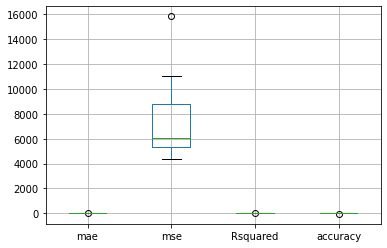

In [ ]:
output.boxplot()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4fe888dd10>,
      dtype=object)

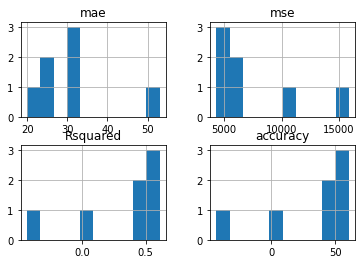

In [ ]:
output.hist()

### 6.1.2 Adding latent variables

In [ ]:
df_latent = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/Data_Created/latent_orbit.csv')

In [ ]:
df_latent

,des,fullname,neo,pha,spkid,moid,e,a,q,i,om,w,ma,tp,per,n,ad
0,29075,29075 (1950 DA),True,True,2029075,0.040100,0.5080,1.700,0.836,12.200,357.00,225.0,320.0,2459290.524,809,0.445,2.56
1,101955,101955 Bennu (1999 RQ36),True,True,2101955,0.003220,0.2040,1.130,0.897,6.030,2.06,66.2,102.0,2455439.142,437,0.824,1.36
2,1979 XB,(1979 XB),True,True,3012393,0.023900,0.7080,2.230,0.650,24.700,86.10,75.6,346.0,2444267.667,1210,0.296,3.81
3,2000 SG344,(2000 SG344),True,False,3054374,0.000903,0.0669,0.977,0.912,0.112,192.00,275.0,240.0,2459318.496,353,1.020,1.04
4,2009 JF1,(2009 JF1),True,False,3459473,0.000194,0.7380,1.890,0.496,6.150,45.60,281.0,149.0,2458806.998,951,0.378,3.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2018 RW,(2018 RW),True,False,3827168,0.000591,0.2420,0.894,0.677,0.699,167.00,311.0,139.0,2459081.154,309,1.170,1.11
1145,2019 UT5,(2019 UT5),True,False,3879551,0.002390,0.6420,2.370,0.848,4.710,30.70,307.0,11.0,2458743.785,1330,0.270,3.89
1146,2017 YK14,(2017 YK14),True,False,3797759,0.004510,0.1960,1.230,0.988,3.090,274.00,181.0,359.0,2458114.160,497,0.724,1.47
1147,2019 BZ3,(2019 BZ3),True,False,3838044,0.005530,0.5790,2.300,0.966,10.700,127.00,339.0,200.0,2459766.518,1270,0.283,3.63


In [ ]:
le = LabelEncoder()
le.fit(df_latent['neo'])
df_latent['neo']=le.transform(df_latent['neo'])
le.fit(df_latent['pha'])
df_latent['pha']=le.transform(df_latent['pha'])

In [ ]:
df_merge = df_impact.merge(df_latent, left_on="Name", right_on="fullname", how="inner")

In [ ]:
df_merge

,Name,Potential_impacts,Cumulative_Impact_probablility,Velocity(km/s),Magnitude,Estimated_Diameter(km),Cum_Palermo_scale,Max_Palermo_scale,Start_year,End_year,Period,des,fullname,neo,pha,spkid,moid,e,a,q,i,om,w,ma,tp,per,n,ad
0,29075 (1950 DA),1,1.200000e-04,14.10,17.6,1.300,-1.42,-1.42,2880,2880,0,29075,29075 (1950 DA),0,1,2029075,0.040100,0.5080,1.700,0.836,12.200,357.00,225.0,320.0,2459290.524,809,0.445,2.56
1,101955 Bennu (1999 RQ36),78,3.700000e-04,5.99,20.2,0.490,-1.69,-2.30,2175,2199,24,101955,101955 Bennu (1999 RQ36),0,1,2101955,0.003220,0.2040,1.130,0.897,6.030,2.06,66.2,102.0,2455439.142,437,0.824,1.36
2,(1979 XB),2,7.400000e-07,23.92,18.5,0.662,-2.79,-3.08,2056,2113,57,1979 XB,(1979 XB),0,1,3012393,0.023900,0.7080,2.230,0.650,24.700,86.10,75.6,346.0,2444267.667,1210,0.296,3.81
3,(2000 SG344),101,2.600000e-03,1.36,24.8,0.037,-2.84,-3.20,2069,2113,44,2000 SG344,(2000 SG344),0,0,3054374,0.000903,0.0669,0.977,0.912,0.112,192.00,275.0,240.0,2459318.496,353,1.020,1.04
4,(2009 JF1),1,2.600000e-04,23.92,27.1,0.013,-2.88,-2.88,2022,2022,0,2009 JF1,(2009 JF1),0,0,3459473,0.000194,0.7380,1.890,0.496,6.150,45.60,281.0,149.0,2458806.998,951,0.378,3.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,(2018 RW),1,5.400000e-09,5.74,30.3,0.003,-11.24,-11.24,2110,2110,0,2018 RW,(2018 RW),0,0,3827168,0.000591,0.2420,0.894,0.677,0.699,167.00,311.0,139.0,2459081.154,309,1.170,1.11
1145,(2019 UT5),1,2.400000e-10,14.16,28.4,0.007,-11.27,-11.27,2080,2080,0,2019 UT5,(2019 UT5),0,0,3879551,0.002390,0.6420,2.370,0.848,4.710,30.70,307.0,11.0,2458743.785,1330,0.270,3.89
1146,(2017 YK14),1,1.700000e-10,3.25,28.2,0.008,-11.58,-11.58,2075,2075,0,2017 YK14,(2017 YK14),0,0,3797759,0.004510,0.1960,1.230,0.988,3.090,274.00,181.0,359.0,2458114.160,497,0.724,1.47
1147,(2019 BZ3),1,1.500000e-10,10.55,28.7,0.006,-11.80,-11.80,2092,2092,0,2019 BZ3,(2019 BZ3),0,0,3838044,0.005530,0.5790,2.300,0.966,10.700,127.00,339.0,200.0,2459766.518,1270,0.283,3.63


In [ ]:
cols = ['des','fullname','spkid']
df_merge = df_merge.drop(columns=cols, axis=1)
df_merge

,Name,Potential_impacts,Cumulative_Impact_probablility,Velocity(km/s),Magnitude,Estimated_Diameter(km),Cum_Palermo_scale,Max_Palermo_scale,Start_year,End_year,Period,neo,pha,moid,e,a,q,i,om,w,ma,tp,per,n,ad
0,29075 (1950 DA),1,1.200000e-04,14.10,17.6,1.300,-1.42,-1.42,2880,2880,0,0,1,0.040100,0.5080,1.700,0.836,12.200,357.00,225.0,320.0,2459290.524,809,0.445,2.56
1,101955 Bennu (1999 RQ36),78,3.700000e-04,5.99,20.2,0.490,-1.69,-2.30,2175,2199,24,0,1,0.003220,0.2040,1.130,0.897,6.030,2.06,66.2,102.0,2455439.142,437,0.824,1.36
2,(1979 XB),2,7.400000e-07,23.92,18.5,0.662,-2.79,-3.08,2056,2113,57,0,1,0.023900,0.7080,2.230,0.650,24.700,86.10,75.6,346.0,2444267.667,1210,0.296,3.81
3,(2000 SG344),101,2.600000e-03,1.36,24.8,0.037,-2.84,-3.20,2069,2113,44,0,0,0.000903,0.0669,0.977,0.912,0.112,192.00,275.0,240.0,2459318.496,353,1.020,1.04
4,(2009 JF1),1,2.600000e-04,23.92,27.1,0.013,-2.88,-2.88,2022,2022,0,0,0,0.000194,0.7380,1.890,0.496,6.150,45.60,281.0,149.0,2458806.998,951,0.378,3.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,(2018 RW),1,5.400000e-09,5.74,30.3,0.003,-11.24,-11.24,2110,2110,0,0,0,0.000591,0.2420,0.894,0.677,0.699,167.00,311.0,139.0,2459081.154,309,1.170,1.11
1145,(2019 UT5),1,2.400000e-10,14.16,28.4,0.007,-11.27,-11.27,2080,2080,0,0,0,0.002390,0.6420,2.370,0.848,4.710,30.70,307.0,11.0,2458743.785,1330,0.270,3.89
1146,(2017 YK14),1,1.700000e-10,3.25,28.2,0.008,-11.58,-11.58,2075,2075,0,0,0,0.004510,0.1960,1.230,0.988,3.090,274.00,181.0,359.0,2458114.160,497,0.724,1.47
1147,(2019 BZ3),1,1.500000e-10,10.55,28.7,0.006,-11.80,-11.80,2092,2092,0,0,0,0.005530,0.5790,2.300,0.966,10.700,127.00,339.0,200.0,2459766.518,1270,0.283,3.63


### 6.1.3 Regression after adding latent variables

In [ ]:
y = df_merge.iloc[:, 1]
cols_drop =['Name','Potential_impacts','End_year']
X = df_merge.drop(columns=cols_drop, axis=1)


In [ ]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [ ]:
names = ["Nearest Neighbors", "Linear SVR", "Gaussian Process",
         "Decision Tree", "Random Forest", "MLP", "AdaBoost"
         ]

regression = [
              KNeighborsRegressor(10),
              SVR(kernel="linear", C=0.025),
              GaussianProcessRegressor(kernel=None, alpha=1e-10, optimizer='fmin_l_bfgs_b', n_restarts_optimizer=0, normalize_y=True, random_state=None),
              DecisionTreeRegressor(criterion='mse', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, ccp_alpha=0.0),
              RandomForestRegressor(max_depth=5, n_estimators=10),
              MLPRegressor(alpha=1, max_iter=2000),
             AdaBoostRegressor(base_estimator=None, n_estimators=50, learning_rate=1.0, loss='linear', random_state=None)
             ]

output1 = pd.DataFrame(columns=['regressor', 'mae', 'mse', 'Rsquared', 'accuracy'])

In [ ]:
import time
max_score = 0.0
max_class = ''
# iterate over regressor
for name, clf in zip(names, regression):
    start_time = time.process_time()
    clf.fit(X_train, y_train)

    score = 100.0 * clf.score(X_test, y_test)
    y_predict = clf.predict(X_test)


    mae = np.round(metrics.mean_absolute_error(y_test, y_predict), 2)
    mse = np.round(metrics.mean_squared_error(y_test, y_predict), 2)
    rsquared = np.round(metrics.r2_score(y_test, y_predict), 2)
    output1 = output1.append({'regressor': name, 'mae':mae, 'mse':mse,'Rsquared':rsquared, 'accuracy':np.round(score, 2)}, ignore_index=True)

    # print("MSE : " , np.round(metrics.mean_squared_error(y_test, y_pred), 2))
    # print("MAE : " , np.round(metrics.mean_absolute_error(y_test, y_pred), 2))
    # print("RSquared : " , np.round(metrics.r2_score(y_test, y_pred), 2))
    # print('Regression = %s, Score (accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds,'%(time.process_time() - start_time))
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name
print(output1)
print(80*'-' )
print('Best --> Regression = %s, Score (accuracy) = %.2f' %(max_class, max_score))

           regressor    mae       mse  Rsquared  accuracy
0  Nearest Neighbors  28.53   7742.62      0.28     27.52
1         Linear SVR  29.20  10609.91      0.01      0.67
2   Gaussian Process  34.30   9149.52      0.14     14.35
3      Decision Tree  22.78   4664.91      0.56     56.33
4      Random Forest  20.57   3616.52      0.66     66.14
5                MLP  35.72   5727.09      0.46     46.39
6           AdaBoost  47.40   4896.66      0.54     54.16
--------------------------------------------------------------------------------
Best --> Regression = Random Forest, Score (accuracy) = 66.14


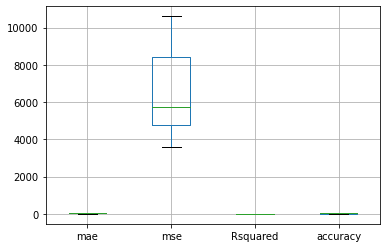

In [ ]:
output1.boxplot()

### **6.1.4 Comparison of the models after including latent variables**

In [ ]:
display(output,"after adding orbital parameters", output1)

,regressor,mae,mse,Rsquared,accuracy
0,Nearest Neighbors,24.14,5468.45,0.51,50.56
1,Linear SVR,29.92,11060.09,0.00,0.01
2,Gaussian Process,53.00,15839.14,-0.43,-43.20
3,Decision Tree,25.10,6062.61,0.45,45.19
4,Random Forest,19.95,4346.76,0.61,60.70
5,MLP,31.69,6467.38,0.42,41.53
6,AdaBoost,29.94,5153.81,0.53,53.41


'after adding orbital parameters'

,regressor,mae,mse,Rsquared,accuracy
0,Nearest Neighbors,28.53,7742.62,0.28,27.52
1,Linear SVR,29.20,10609.91,0.01,0.67
2,Gaussian Process,34.30,9149.52,0.14,14.35
3,Decision Tree,22.78,4664.91,0.56,56.33
4,Random Forest,20.57,3616.52,0.66,66.14
5,MLP,35.72,5727.09,0.46,46.39
6,AdaBoost,47.40,4896.66,0.54,54.16


### Saving the model

In [ ]:
#rf = RandomForestRegressor(max_depth=5, n_estimators=10)
clf_best.fit(X_train,y_train)
y_pred = clf_best.predict(X_test)

Text(0, 0.5, 'Predictions')

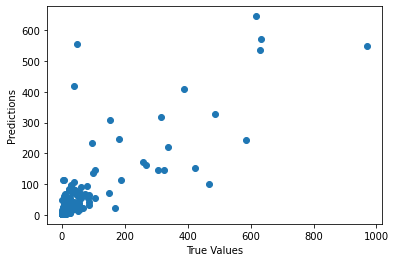

In [ ]:
#plotting data
plt.scatter(y_test, y_pred,)
plt.xlabel('True Values')
plt.ylabel('Predictions')

In [ ]:
#saving the file
import pickle
filename = '/content/drive/MyDrive/Colab Notebooks/MLSpring-2021/teams/Underdog/Midterm-Project/Data/pickle files/mullerloop_regression_model.sav'

pickle.dump(clf_best, open(filename, 'wb'))

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))

In [ ]:
import plotly.express as px
fig = px.histogram(df_merge, x='Name',y='Potential_impacts',histfunc='sum',title="Potential Impacts Distribution",histnorm='density')
fig.show()

## **6.2 Finding impact of asteroids which might approach near earth in 60 days (from 04/04/2020)**


In [ ]:
# Let's load the packages
import numpy as np
import pandas as pd

### 6.2.1Cneos close approach data

In [ ]:
# If restarted always run the Import Libraries and authenticate using your google drive account
path = '/content/drive/MyDrive/Underdog/cneos_closeapproach_data.csv'
cneos_closeapproach_data = pd.read_csv(path)
cneos_closeapproach_data

,Object,Close-Approach (CA) Date,CA Distance Nominal (LD | au),CA Distance Minimum (LD | au),V relative (km/s),V infinity (km/s),H (mag),Diameter,Unnamed: 8
0,(2015 MB54),2021-Apr-06 11:04 ± < 00:01,13.53 | 0.03476,13.53 | 0.03476,3.71,3.69,24.0,43 m - 96 m,bK15M54B
1,(2021 GB),2021-Apr-06 17:03 ± 00:02,7.88 | 0.02024,7.85 | 0.02018,3.95,3.92,27.0,10 m - 23 m,bK21G00B
2,(2020 GE1),2021-Apr-07 03:18 ± 00:10,12.13 | 0.03117,12.10 | 0.03108,4.18,4.16,27.1,10 m - 23 m,bK20G01E
3,(2014 FO38),2021-Apr-07 10:46 ± 00:29,16.72 | 0.04296,16.70 | 0.04291,8.34,8.34,26.3,15 m - 33 m,bK14F38O
4,(2021 EH4),2021-Apr-08 00:18 ± < 00:01,13.01 | 0.03343,12.96 | 0.03330,7.66,7.65,24.9,27 m - 61 m,bK21E04H
5,(2020 UY1),2021-Apr-15 07:50 ± 04:37,15.96 | 0.04101,14.03 | 0.03605,8.75,8.74,26.0,17 m - 38 m,bK20U01Y
6,(2017 HG4),2021-Apr-16 17:16 ± 18:03,7.57 | 0.01946,5.99 | 0.01538,4.12,4.09,27.7,7.7 m - 17 m,bK17H04G
7,(2020 HE5),2021-Apr-17 16:50 ± 00:09,8.48 | 0.02178,8.34 | 0.02143,4.32,4.29,27.7,7.7 m - 17 m,bK20H05E
8,(2019 HQ),2021-Apr-20 07:48 ± 06:24,14.73 | 0.03785,13.52 | 0.03475,8.80,8.80,26.2,15 m - 34 m,bK19H00Q
9,(2020 HO5),2021-Apr-22 16:49 ± 00:09,16.48 | 0.04234,16.40 | 0.04213,3.34,3.32,28.5,5.3 m - 12 m,bK20H05O


### 6.2.2 Feature Importance

Since the close approach dataset only has three related features, comparing to the cenos sentry dataset. These features are Velocity(km/s)', 'Magnitude', 'Estimated_Diameter(km)'. We want to find the most related feature to the feature 'potentail impacts' in the cenos sentry dataset.

In [ ]:
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

In [ ]:
X = cneos_sentry_data[['Velocity(km/s)', 'Magnitude', 'Estimated_Diameter(km)']]
y = cneos_sentry_data['Potential_impacts']

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

Feature ranking:
1. feature 0 (f0.556163)
2. feature 1 (f0.258561)
3. feature 2 (f0.185276)


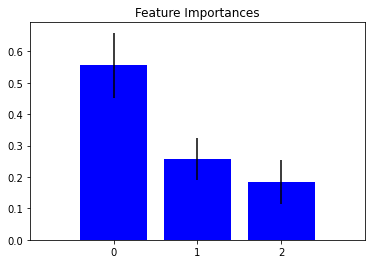

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor
ef = ExtraTreesRegressor(n_estimators=250,random_state=0)
ef.fit(X,y)
importances = ef.feature_importances_
std = np.std([tree.feature_importances_ for tree in ef.estimators_], axis=0)
indices = np.argsort(importances)[::-1]
#printing the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
  print("%d. feature %d (f%f)" % (f + 1, indices[f], importances[indices[f]]))

#plot the impurity based feature importances of the forest
plt.figure()
plt.title("Feature Importances")
plt.bar(range(X.shape[1]), importances[indices], color='b', yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

Conclusion: Among the features 'Velocity(km/s)', 'Magnitude', 'Estimated_Diameter(km)', Velocity(km/s) is the most important feature. So, we will apply that to ML algorithm and create a model.

### 6.2.3 Apply Muller loop to find the best ML algorithm

In [ ]:
from sklearn import metrics
import numpy as np
import time
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
# from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
# from sklearn.naive_bayes import GaussianNB
# from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

In [ ]:
X = cneos_sentry_data[['Velocity(km/s)']]
y = cneos_sentry_data['Potential_impacts']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
y_train = y_train.values.ravel()

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train= scaler.fit_transform(X_train)
X_test= scaler.fit_transform(X_test)

In [ ]:
names = ["Nearest Neighbors", "Linear SVR", "Gaussian Process",
         "Decision Tree", "Random Forest", "MLP", "AdaBoost"
         ]

regression = [
    KNeighborsRegressor(2),
    SVR(kernel='rbf', degree=3, gamma='scale', coef0=0.0, tol=0.001, C=1.0, epsilon=0.1, shrinking=True, cache_size=200, verbose=False, max_iter=- 1),
    GaussianProcessRegressor(kernel=None, alpha=1e-10, optimizer='fmin_l_bfgs_b', n_restarts_optimizer=0, normalize_y=False, copy_X_train=True, random_state=None),
    DecisionTreeRegressor(criterion='mse', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, ccp_alpha=0.0),
    RandomForestRegressor(max_depth=5, n_estimators=10, max_features=1),
    MLPRegressor(alpha=1, max_iter=1500),
    AdaBoostRegressor(base_estimator=None, n_estimators=50, learning_rate=1.0, loss='linear', random_state=None)
    # GaussianNB()]
    # QuadraticDiscriminantAnalysis()
    ]

output = pd.DataFrame(columns=['regressor', 'mae', 'mse', 'Rsquared', 'accuracy'])

In [ ]:
import time

max_score = 0.0
max_class = ''
# iterate over regressor
for name, clf in zip(names, regression):
    start_time = time.process_time()
    clf.fit(X_train, y_train)

    score = 100.0 * clf.score(X_test, y_test)
    y_predict = clf.predict(X_test)


    mae = np.round(metrics.mean_absolute_error(y_test, y_predict), 2)
    mse = np.round(metrics.mean_squared_error(y_test, y_predict), 2)
    rsquared = np.round(metrics.r2_score(y_test, y_predict), 2)
    output = output.append({'regressor': name, 'mae':mae, 'mse':mse,'Rsquared':rsquared, 'accuracy':score}, ignore_index=True)

    # print("MSE : " , np.round(metrics.mean_squared_error(y_test, y_pred), 2))
    # print("MAE : " , np.round(metrics.mean_absolute_error(y_test, y_pred), 2))
    # print("RSquared : " , np.round(metrics.r2_score(y_test, y_pred), 2))
    # print('Regression = %s, Score (accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds,'%(time.process_time() - start_time))
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name
print(output)
print(80*'-' )
print('Best --> Regression = %s, Score (accuracy) = %.2f' %(max_class, max_score))

            regressor     mae         mse  Rsquared       accuracy
0   Nearest Neighbors   42.02     9744.55     -0.89     -88.581019
1          Linear SVR   22.53     5452.81     -0.06      -5.525228
2    Gaussian Process  214.81  6727853.47  -1301.00 -130100.465958
3       Decision Tree   42.94    11636.04     -1.25    -125.185943
4       Random Forest   34.85     5819.75     -0.13     -12.626375
5                 MLP   36.09     5153.53      0.00       0.266645
6            AdaBoost   60.37     8883.46     -0.72     -71.916730
7   Nearest Neighbors   41.73     8732.34     -0.69     -68.992110
8          Linear SVR   22.52     5453.47     -0.06      -5.538044
9    Gaussian Process   35.59     5319.14     -0.03      -2.938313
10      Decision Tree   45.40    11513.52     -1.23    -122.814941
11      Random Forest   35.28     5990.37     -0.16     -15.928293
12                MLP   36.22     5118.85      0.01       0.937706
13           AdaBoost   72.28    10105.78     -0.96     -95.57

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Conclusion: To find the regression relationship with 'volocity' and 'Potential impacts', we applied the muller loop to find the best algorithm. After that, the best regression ML algorihtm is MLP.

### 6.2.4 Use MLP to find the Potential impacts of Cneos close approach data

In [ ]:
X = cneos_sentry_data[['Velocity(km/s)']]
y = cneos_sentry_data['Potential_impacts']

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X= scaler.fit_transform(X)

In [ ]:
MLP_model = MLPRegressor(alpha=1, max_iter=1500).fit(X, y)

In [ ]:
# save the model for further usage
# import pickle
# with open('MLP_model_from_cneos_dataset', 'wb') as f:
#   pickle.dump(MLP_model, f)

In [ ]:
path = '/content/drive/MyDrive/Underdog/cneos_closeapproach_data_cleaned.csv'
cneos_closeapproach_data = pd.read_csv(path)
cneos_closeapproach_data

,Unnamed: 0,Name,Close-Approach (CA) Date,CA Distance Nominal(LD),CA Distance Minimum(LD),V relative (km/s),V infinity (km/s),Magnitude,min_Diameter(m),max_Diameter(m)
0,0,2015 MB54,2021-Apr-06 11:04 ± < 00:01,13.53,13.53,3.71,3.69,24.0,43.0,96.0
1,1,2021 GB,2021-Apr-06 17:03 ± 00:02,7.88,7.85,3.95,3.92,27.0,10.0,23.0
2,2,2020 GE1,2021-Apr-07 03:18 ± 00:10,12.13,12.10,4.18,4.16,27.1,10.0,23.0
3,3,2014 FO38,2021-Apr-07 10:46 ± 00:29,16.72,16.70,8.34,8.34,26.3,15.0,33.0
4,4,2021 EH4,2021-Apr-08 00:18 ± < 00:01,13.01,12.96,7.66,7.65,24.9,27.0,61.0
5,5,2020 UY1,2021-Apr-15 07:50 ± 04:37,15.96,14.03,8.75,8.74,26.0,17.0,38.0
6,6,2017 HG4,2021-Apr-16 17:16 ± 18:03,7.57,5.99,4.12,4.09,27.7,7.7,17.0
7,7,2020 HE5,2021-Apr-17 16:50 ± 00:09,8.48,8.34,4.32,4.29,27.7,7.7,17.0
8,8,2019 HQ,2021-Apr-20 07:48 ± 06:24,14.73,13.52,8.80,8.80,26.2,15.0,34.0
9,9,2020 HO5,2021-Apr-22 16:49 ± 00:09,16.48,16.40,3.34,3.32,28.5,5.3,12.0


In [ ]:
# since there are two velocity features in the dataframe, and the value between two features are very small, we can careate a new
# feature by taking the average of them
mean_velocity = cneos_closeapproach_data.loc[: , "V relative (km/s)":"V infinity (km/s)"]
cneos_closeapproach_data['velocity_mean'] = mean_velocity.mean(axis=1)
cneos_closeapproach_data

,Unnamed: 0,Name,Close-Approach (CA) Date,CA Distance Nominal(LD),CA Distance Minimum(LD),V relative (km/s),V infinity (km/s),Magnitude,min_Diameter(m),max_Diameter(m),velocity_mean
0,0,2015 MB54,2021-Apr-06 11:04 ± < 00:01,13.53,13.53,3.71,3.69,24.0,43.0,96.0,3.700
1,1,2021 GB,2021-Apr-06 17:03 ± 00:02,7.88,7.85,3.95,3.92,27.0,10.0,23.0,3.935
2,2,2020 GE1,2021-Apr-07 03:18 ± 00:10,12.13,12.10,4.18,4.16,27.1,10.0,23.0,4.170
3,3,2014 FO38,2021-Apr-07 10:46 ± 00:29,16.72,16.70,8.34,8.34,26.3,15.0,33.0,8.340
4,4,2021 EH4,2021-Apr-08 00:18 ± < 00:01,13.01,12.96,7.66,7.65,24.9,27.0,61.0,7.655
5,5,2020 UY1,2021-Apr-15 07:50 ± 04:37,15.96,14.03,8.75,8.74,26.0,17.0,38.0,8.745
6,6,2017 HG4,2021-Apr-16 17:16 ± 18:03,7.57,5.99,4.12,4.09,27.7,7.7,17.0,4.105
7,7,2020 HE5,2021-Apr-17 16:50 ± 00:09,8.48,8.34,4.32,4.29,27.7,7.7,17.0,4.305
8,8,2019 HQ,2021-Apr-20 07:48 ± 06:24,14.73,13.52,8.80,8.80,26.2,15.0,34.0,8.800
9,9,2020 HO5,2021-Apr-22 16:49 ± 00:09,16.48,16.40,3.34,3.32,28.5,5.3,12.0,3.330


In [ ]:
X = cneos_closeapproach_data[['velocity_mean']]

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X= scaler.fit_transform(X)

In [ ]:
cneos_closeapproach_data['Potential_impacts'] = MLP_model.predict(X)
cneos_closeapproach_data

,Unnamed: 0,Name,Close-Approach (CA) Date,CA Distance Nominal(LD),CA Distance Minimum(LD),V relative (km/s),V infinity (km/s),Magnitude,min_Diameter(m),max_Diameter(m),velocity_mean,Potential_impacts
0,0,2015 MB54,2021-Apr-06 11:04 ± < 00:01,13.53,13.53,3.71,3.69,24.0,43.0,96.0,3.700,49.682105
1,1,2021 GB,2021-Apr-06 17:03 ± 00:02,7.88,7.85,3.95,3.92,27.0,10.0,23.0,3.935,48.128110
2,2,2020 GE1,2021-Apr-07 03:18 ± 00:10,12.13,12.10,4.18,4.16,27.1,10.0,23.0,4.170,46.574114
3,3,2014 FO38,2021-Apr-07 10:46 ± 00:29,16.72,16.70,8.34,8.34,26.3,15.0,33.0,8.340,22.549935
4,4,2021 EH4,2021-Apr-08 00:18 ± < 00:01,13.01,12.96,7.66,7.65,24.9,27.0,61.0,7.655,23.292478
5,5,2020 UY1,2021-Apr-15 07:50 ± 04:37,15.96,14.03,8.75,8.74,26.0,17.0,38.0,8.745,22.381139
6,6,2017 HG4,2021-Apr-16 17:16 ± 18:03,7.57,5.99,4.12,4.09,27.7,7.7,17.0,4.105,47.003943
7,7,2020 HE5,2021-Apr-17 16:50 ± 00:09,8.48,8.34,4.32,4.29,27.7,7.7,17.0,4.305,45.681394
8,8,2019 HQ,2021-Apr-20 07:48 ± 06:24,14.73,13.52,8.80,8.80,26.2,15.0,34.0,8.800,22.358216
9,9,2020 HO5,2021-Apr-22 16:49 ± 00:09,16.48,16.40,3.34,3.32,28.5,5.3,12.0,3.330,52.128822


In [ ]:
import plotly.express as px
fig = px.histogram(cneos_closeapproach_data, x='Name',y='Potential_impacts',histfunc='sum',title="Potential Impacts Distribution",histnorm='density')
fig.show()

Conclusion: the asteroids named "2020 HO5", "2021 EZ4" has highest potential impacts to the Earth, they both have over 50 in the potential impacts level.

In [ ]:
df = pd.merge(cneos_closeapproach_data, cneos_sentry_data, left_on='Name', right_on='Name')
#df = pd.concat([cneos_sentry_data, cneos_closeapproach_data])
#df = cneos_closeapproach_data.merge(cneos_sentry_data, how='inner')
# df = cneos_closeapproach_data.merge(cneos_sentry_data, how='left',left_index=True, right_index=True)
df

,Name,Close-Approach (CA) Date,CA Distance Nominal(LD),CA Distance Minimum(LD),V relative (km/s),V infinity (km/s),Magnitude_x,min_Diameter(m),max_Diameter(m),Potential_impacts,Cumulative_Impact_probablility,Velocity(km/s),Magnitude_y,Estimated_Diameter(km),Cum_Palermo_scale,Max_Palermo_scale,Start_year,End_year,Period
0,2017 HG4,2021-Apr-16 17:16 ± 18:03,7.57,5.99,4.12,4.09,27.7,7.7,17.0,23,0.000039,3.71,27.6,0.010,-5.85,-6.55,2048,2115,67
1,2018 LB,2021-Jun-01 16:56 ± 19:15,2.87,0.91,7.69,7.65,26.0,17.0,38.0,11,0.000004,7.43,26.0,0.022,-6.28,-6.80,2092,2116,24


Conclusion: After combine two datasets with same name. Only two asteroids, '2017HG4' and '2018LB'are found in the cneos sentry dataset. For the cneos dataset, we stopped here.

## Merging with the impact dataset to find asteroids which might approach earth in 60 days

In [ ]:
df = pd.merge(cneos_closeapproach_data, cneos_sentry_data, left_on='Name', right_on='Name')
#df = pd.concat([cneos_sentry_data, cneos_closeapproach_data])
#df = cneos_closeapproach_data.merge(cneos_sentry_data, how='inner')
# df = cneos_closeapproach_data.merge(cneos_sentry_data, how='left',left_index=True, right_index=True)
df

,Unnamed: 0,Name,Close-Approach (CA) Date,CA Distance Nominal(LD),CA Distance Minimum(LD),V relative (km/s),V infinity (km/s),Magnitude_x,min_Diameter(m),max_Diameter(m),velocity_mean,Potential_impacts_x,Potential_impacts_y,Cumulative_Impact_probablility,Velocity(km/s),Magnitude_y,Estimated_Diameter(km),Cum_Palermo_scale,Max_Palermo_scale,Start_year,End_year,Period
0,6,2017 HG4,2021-Apr-16 17:16 ± 18:03,7.57,5.99,4.12,4.09,27.7,7.7,17.0,4.105,47.187703,23,0.000039,3.71,27.6,0.010,-5.85,-6.55,2048,2115,67
1,23,2018 LB,2021-Jun-01 16:56 ± 19:15,2.87,0.91,7.69,7.65,26.0,17.0,38.0,7.670,22.155445,11,0.000004,7.43,26.0,0.022,-6.28,-6.80,2092,2116,24


Conclusion: After combine two datasets with same name. Only two asteroids, '2017HG4' and '2018LB'are found in the cneos sentry dataset. For the cneos dataset, we stopped here.

In [ ]:
#Volume = (4/3).pi.radius^3
df['Volume']= (4/3) * np.pi * (((df['Estimated_Diameter(km)']/2)*1000)**3)
df

,Unnamed: 0,Name,Close-Approach (CA) Date,CA Distance Nominal(LD),CA Distance Minimum(LD),V relative (km/s),V infinity (km/s),Magnitude_x,min_Diameter(m),max_Diameter(m),velocity_mean,Potential_impacts_x,Potential_impacts_y,Cumulative_Impact_probablility,Velocity(km/s),Magnitude_y,Estimated_Diameter(km),Cum_Palermo_scale,Max_Palermo_scale,Start_year,End_year,Period,Volume
0,6,2017 HG4,2021-Apr-16 17:16 ± 18:03,7.57,5.99,4.12,4.09,27.7,7.7,17.0,4.105,47.187703,23,0.000039,3.71,27.6,0.010,-5.85,-6.55,2048,2115,67,523.598776
1,23,2018 LB,2021-Jun-01 16:56 ± 19:15,2.87,0.91,7.69,7.65,26.0,17.0,38.0,7.670,22.155445,11,0.000004,7.43,26.0,0.022,-6.28,-6.80,2092,2116,24,5575.279763


In [ ]:
#Assuming asteroid is made of normal rock, with an average density of 3500 kg per cubic meter,
#Mass = density * Volume
df['Mass'] = df['Volume']* 3500
#Kinetic energy = 0.5*mass*velocity^2
df['Kinetic_energy(J)'] = 0.5 * df['Mass'] *((df['Velocity(km/s)'] * 1000)**2)
df

,Unnamed: 0,Name,Close-Approach (CA) Date,CA Distance Nominal(LD),CA Distance Minimum(LD),V relative (km/s),V infinity (km/s),Magnitude_x,min_Diameter(m),max_Diameter(m),velocity_mean,Potential_impacts_x,Potential_impacts_y,Cumulative_Impact_probablility,Velocity(km/s),Magnitude_y,Estimated_Diameter(km),Cum_Palermo_scale,Max_Palermo_scale,Start_year,End_year,Period,Volume,Mass,Kinetic_energy(J)
0,6,2017 HG4,2021-Apr-16 17:16 ± 18:03,7.57,5.99,4.12,4.09,27.7,7.7,17.0,4.105,47.187703,23,0.000039,3.71,27.6,0.010,-5.85,-6.55,2048,2115,67,523.598776,1.832596e+06,1.261202e+13
1,23,2018 LB,2021-Jun-01 16:56 ± 19:15,2.87,0.91,7.69,7.65,26.0,17.0,38.0,7.670,22.155445,11,0.000004,7.43,26.0,0.022,-6.28,-6.80,2092,2116,24,5575.279763,1.951348e+07,5.386198e+14


Conclusion: When meteoritic material enters the atmosphere, surfaces are heated dramatically, with huge kinetic energy. We applied the kinetic energy formula and found that the kinetic energy scale of two most Neo(near earth object) close approached asteroids.

# **7. Metric Comparison Table**

Data Narrative :

Classification

- We achieved 100% Accuracy in identifying the NEA( Near-Earth Object) and PHA(Potentially Hazardous Asteroids)

Regression

- We identified different metric scores and accuracy comparing the original dataset with the first and second latent variables.

- The regression improves after the second latent variables ( Orbital Parameters )


- Original Accuracy - 60.70%

- First Latent Variable - 66.14%

- Scecond Latent Anaysis - 0.94




**Original Classification Metric Score**

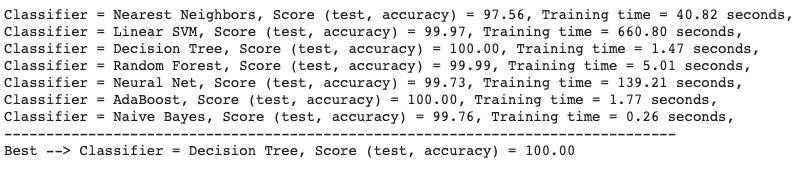


**Original Data Regression Metric Score**

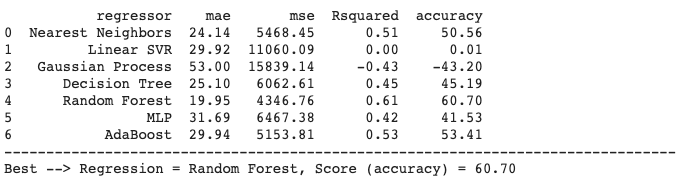

**Comparison of Original Data and First Laternt Analysis - Regression Metric Score**

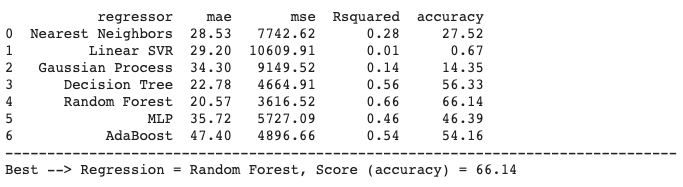

**Comparison of First Latent and Second Laternt Analysis - Regression Metric Score**

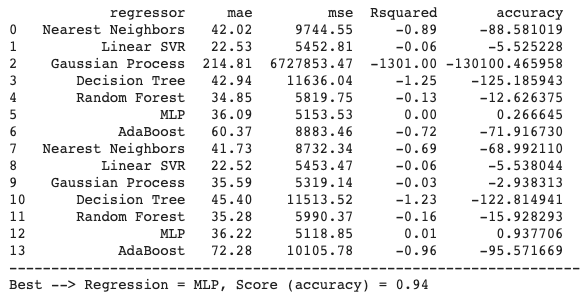